In [1]:

import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"



In [2]:
# Step 1: LabelMe to YOLOv8 Classification Dataset Converter

import os
import json
import cv2
import numpy as np
import shutil
import random
from tqdm import tqdm

# Configuration - modify these paths as needed
DATA_ROOT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification"  # Root folder containing clean, medium_soiled, fully_soiled folders
OUTPUT_DIR = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset"  # Directory for processed dataset
SPLIT_RATIO = [0.8, 0.1, 0.1]  # Train/val/test split ratio
MIN_SIZE = 64  # Minimum size for extracted panels

# Create the folder structure
def create_folder_structure(output_dir, classes):
    """Create the folder structure for YOLOv8 classification"""
    os.makedirs(output_dir, exist_ok=True)
    
    # Create split directories
    for split in ['train', 'val', 'test']:
        split_dir = os.path.join(output_dir, split)
        os.makedirs(split_dir, exist_ok=True)
        
        # Create class directories inside each split
        for cls in classes:
            os.makedirs(os.path.join(split_dir, cls), exist_ok=True)
    
    print(f"Created folder structure in {output_dir}")

# Get classes from folder names
classes = [d for d in os.listdir(DATA_ROOT) 
          if os.path.isdir(os.path.join(DATA_ROOT, d))]

if not classes:
    print(f"Error: No class directories found in {DATA_ROOT}")
else:
    print(f"Found {len(classes)} classes: {', '.join(classes)}")
    
    # Create output folder structure
    create_folder_structure(OUTPUT_DIR, classes)

Found 4 classes: clean, fully soiled, medium soiled, yolo_processed_dataset
Created folder structure in C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset


In [7]:
# Step 1 (continued): Extract panels from LabelMe annotations

def extract_panels_from_labelme(data_root, output_dir, classes, split_ratio, min_size):
    """Extract panel images from LabelMe annotations"""
    # Counters
    total_panels = 0
    class_counts = {cls: 0 for cls in classes}
    
    # Process each class folder
    for cls in classes:
        class_dir = os.path.join(data_root, cls)
        if not os.path.isdir(class_dir):
            print(f"Warning: Class directory {class_dir} not found. Skipping.")
            continue
        
        # Get all image files
        image_files = [f for f in os.listdir(class_dir) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png')) and 
                      os.path.exists(os.path.join(class_dir, os.path.splitext(f)[0] + '.json'))]
        
        if not image_files:
            print(f"Warning: No valid image-annotation pairs found in {class_dir}")
            continue
            
        print(f"Processing {len(image_files)} images in class '{cls}'")
        
        # Process each image
        for img_file in tqdm(image_files, desc=f"Processing {cls}"):
            # Load image
            img_path = os.path.join(class_dir, img_file)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Warning: Could not read {img_path}. Skipping.")
                continue
                
            # Load annotation
            json_path = os.path.join(class_dir, os.path.splitext(img_file)[0] + '.json')
            with open(json_path, 'r') as f:
                try:
                    annotation = json.load(f)
                except json.JSONDecodeError:
                    print(f"Warning: Could not parse {json_path}. Skipping.")
                    continue
            
            # Process each shape (panel)
            for shape_idx, shape in enumerate(annotation.get('shapes', [])):
                if shape['shape_type'] != 'polygon':
                    continue
                    
                # Get label and points
                label = shape['label']
                points = np.array(shape['points'], dtype=np.int32)
                
                # Create mask
                h, w = img.shape[:2]
                mask = np.zeros((h, w), dtype=np.uint8)
                cv2.fillPoly(mask, [points], 255)
                
                # Get bounding box
                x, y, w, h = cv2.boundingRect(points)
                
                # Skip if too small
                if w < min_size or h < min_size:
                    continue
                
                # Extract panel region
                panel_img = img[y:y+h, x:x+w].copy()
                panel_mask = mask[y:y+h, x:x+w]
                
                # Apply mask
                for c in range(3):
                    panel_img[:, :, c] = np.where(panel_mask == 255, 
                                                 panel_img[:, :, c], 
                                                 0)
                
                # Determine split (train/val/test)
                rand_val = random.random()
                if rand_val < split_ratio[0]:
                    split = 'train'
                elif rand_val < split_ratio[0] + split_ratio[1]:
                    split = 'val'
                else:
                    split = 'test'
                
                # Save extracted panel
                output_filename = f"{cls}_{total_panels:06d}.jpg"
                output_path = os.path.join(output_dir, split, label, output_filename)
                cv2.imwrite(output_path, panel_img)
                
                total_panels += 1
                class_counts[label] = class_counts.get(label, 0) + 1
    
    # Print summary
    print(f"\nExtracted {total_panels} panel images:")
    for cls, count in class_counts.items():
        print(f"  - {cls}: {count} panels")

# Run the extraction
extract_panels_from_labelme(DATA_ROOT, OUTPUT_DIR, classes, SPLIT_RATIO, MIN_SIZE)

Processing 205 images in class 'clean'


Processing clean: 100%|██████████| 205/205 [00:31<00:00,  6.41it/s]


Processing 152 images in class 'fully soiled'


Processing fully soiled: 100%|██████████| 152/152 [00:22<00:00,  6.70it/s]


Processing 206 images in class 'medium soiled'


Processing medium soiled: 100%|██████████| 206/206 [00:42<00:00,  4.90it/s]


Extracted 2120 panel images:
  - clean: 786 panels
  - fully soiled: 623 panels
  - medium soiled: 711 panels


In [8]:
# Step 1 (final part): Create dataset.yaml file for YOLOv8

def create_dataset_yaml(output_dir, classes):
    """Create dataset.yaml file for YOLOv8"""
    yaml_content = f"""
# YOLOv8 Classification dataset config
path: {os.path.abspath(OUTPUT_DIR)}
train: train
val: val
test: test

# Classes
names:
"""
    
    for i, cls in enumerate(classes):
        yaml_content += f"  {i}: {cls}\n"
    
    yaml_path = os.path.join(output_dir, 'C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset/dataset.yaml')
    with open(yaml_path, 'w') as f:
        f.write(yaml_content)
    
    print(f"Created dataset.yaml at {yaml_path}")

# Create the YAML file
create_dataset_yaml(OUTPUT_DIR, classes)

Created dataset.yaml at C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset/dataset.yaml


In [9]:
%pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Step 2: Train YOLOv8 Classification Model

from ultralytics import YOLO
import os

# Configuration
DATASET_YAML = 'C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset'
MODEL_DIR = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset/models"  # Directory to save the trained model
os.makedirs(MODEL_DIR, exist_ok=True)

# Initialize YOLOv8 model for classification
model = YOLO('yolov8l-cls.pt')  # Start with a pre-trained large model

# Display training options
print("Starting YOLOv8 training with the following configuration:")
print(f"- Dataset: {DATASET_YAML}")
print(f"- Base model: yolov8l-cls.pt")
print(f"- Output directory: {MODEL_DIR}/solar_panel_classifier")
print("- Epochs: 50")
print("- Image size: 224")
print("- Batch size: 16")
print("- Early stopping patience: 10")
print()
print("Training will take some time depending on your hardware...")

# Train the model
results = model.train(
    data=DATASET_YAML,
    epochs=50,
    imgsz=224,
    batch=16,
    patience=10,
    project=MODEL_DIR,
    name="solar_panel_classifier"
)

# Get path to best model
best_model_path = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
print(f"\nTraining completed! Best model saved to: {best_model_path}")

Starting YOLOv8 training with the following configuration:
- Dataset: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset
- Base model: yolov8l-cls.pt
- Output directory: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset/models/solar_panel_classifier
- Epochs: 50
- Image size: 224
- Batch size: 16
- Early stopping patience: 10

Training will take some time depending on your hardware...
New https://pypi.org/project/ultralytics/8.3.88 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.51  Python-3.12.7 torch-2.5.1+cu121 CUDA:0 (NVIDIA RTX A2000 8GB Laptop GPU, 8192MiB)
engine\trainer: task=classify, mode=train, model=yolov8l-cls.pt, data=C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_datas

train: Scanning C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\train... 1672 images, 0 corrupt: 100%|██████████| 1672/1672 [00:00<?, ?it/s]
val: Scanning C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\val... 215 images, 0 corrupt: 100%|██████████| 215/215 [00:00<?, ?it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 50 weight(decay=0.0), 51 weight(decay=0.0005), 51 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 224 train, 224 val
Using 8 dataloader workers
Logging results to C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\models\solar_panel_classifier
Starting training for 50 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 21.53it/s]

                   all      0.688          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 22.29it/s]

                   all      0.693          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 22.38it/s]


                   all      0.581          1

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 22.42it/s]

                   all      0.688          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 22.12it/s]

                   all      0.637          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 21.80it/s]

                   all      0.712          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 21.43it/s]

                   all      0.698          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 20.58it/s]


                   all      0.693          1

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 20.40it/s]

                   all      0.679          1



      Epoch    GPU_mem       loss  Instances       Size


      10/50      1.71G     0.5181          8        224: 100%|██████████| 105/105 [00:09<00:00, 10.75it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 20.56it/s]

                   all      0.693          1



      Epoch    GPU_mem       loss  Instances       Size


      11/50      1.65G     0.5064          8        224: 100%|██████████| 105/105 [00:09<00:00, 10.59it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 20.21it/s]

                   all       0.67          1



      Epoch    GPU_mem       loss  Instances       Size


      12/50      1.71G     0.5295          8        224: 100%|██████████| 105/105 [00:10<00:00, 10.49it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 19.62it/s]

                   all      0.693          1



      Epoch    GPU_mem       loss  Instances       Size


      13/50      1.71G     0.4939          8        224: 100%|██████████| 105/105 [00:10<00:00, 10.49it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 20.17it/s]

                   all      0.707          1



      Epoch    GPU_mem       loss  Instances       Size


      14/50       1.7G     0.5277          8        224: 100%|██████████| 105/105 [00:10<00:00, 10.42it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 20.27it/s]

                   all      0.684          1



      Epoch    GPU_mem       loss  Instances       Size


      15/50      1.63G     0.5101          8        224: 100%|██████████| 105/105 [00:09<00:00, 11.22it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 22.12it/s]

                   all      0.688          1



      Epoch    GPU_mem       loss  Instances       Size


      16/50      1.75G     0.4981          8        224: 100%|██████████| 105/105 [00:09<00:00, 11.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 20.99it/s]

                   all      0.702          1
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 6, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



16 epochs completed in 0.049 hours.
Optimizer stripped from C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\models\solar_panel_classifier\weights\last.pt, 72.6MB
Optimizer stripped from C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\models\solar_panel_classifier\weights\best.pt, 72.6MB

Validating C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\models\solar_panel_classifier\weights\best.pt...
Ultralytics 8.3.51  Python-3.12.7 torch-2.5.1+cu121 CUDA:0 (NVIDIA RTX A2000 8GB Laptop GPU, 8192MiB)
YOLOv8l-cls summary (fused): 133 layers, 36,188,419 parameters, 0 gradients, 98.7 GFLOPs
train: C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation +

               classes   top1_acc   top5_acc: 100%|██████████| 7/7 [00:00<00:00, 21.59it/s]


                   all      0.712          1
Speed: 0.1ms preprocess, 1.4ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\models\solar_panel_classifier

Training completed! Best model saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset/models\solar_panel_classifier\weights\best.pt


In [8]:
# Check the exact folder structure
import os

# Print OUTPUT_DIR to confirm its value
print(f"OUTPUT_DIR: {OUTPUT_DIR}")

# List the contents of the OUTPUT_DIR to see what's actually there
print("\nContents of OUTPUT_DIR:")
for item in os.listdir(OUTPUT_DIR):
    print(f"- {item}")

# Check what's in the test directory
test_dir = os.path.join(OUTPUT_DIR, 'test')
if os.path.exists(test_dir):
    print(f"\nContents of test directory:")
    for item in os.listdir(test_dir):
        print(f"- {item}")
else:
    print(f"\nTest directory does not exist at: {test_dir}")

# Check the classes variable to ensure it matches folder names
print(f"\nClasses variable contains: {classes}")

OUTPUT_DIR: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/yolo_processed_dataset

Contents of OUTPUT_DIR:
- dataset.yaml
- models
- test
- train
- train.cache
- val
- val.cache

Contents of test directory:
- clean
- fully soiled
- medium soiled

Classes variable contains: ['clean', 'fully soiled', 'medium soiled', 'yolo_processed_dataset']


In [7]:
# Step 3: Test the YOLOv8 Classification Model on some sample images

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

# Load the trained model
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
classifier = YOLO(MODEL_PATH)

# Define class colors (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),         # Green
    "medium_soiled": (0, 165, 255),  # Orange
    "fully_soiled": (0, 0, 255)      # Red
}

# Correct the classes list
correct_classes = ['clean', 'fully soiled', 'medium soiled']

# Load a few test images
test_images = []
for cls in correct_classes:
    test_dir = os.path.join(OUTPUT_DIR, 'test', cls)
    if os.path.exists(test_dir):
        files = os.listdir(test_dir)
        if files:
            # Get 2 random images from each class
            selected = np.random.choice(files, min(2, len(files)), replace=False)
            for file in selected:
                img_path = os.path.join(test_dir, file)
                test_images.append((img_path, cls))  # Save path and true class
    else:
        print(f"Warning: Test directory not found for class {cls}")

# Run classification and display results
plt.figure(figsize=(15, 10))
for i, (img_path, true_cls) in enumerate(test_images):
    if i >= 6:  # Limit to 6 images for display
        break
        
    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Classify
    results = classifier(img)[0]
    
    # Get prediction and confidence
    pred_cls = results.names[int(results.probs.top1)]
    confidence = float(results.probs.top1conf)
    
    # Display
    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    color = 'green' if pred_cls == true_cls else 'red'
    plt.title(f"True: {true_cls}\nPred: {pred_cls} ({confidence:.2f})", color=color)
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Model classification test complete!")


0: 224x224 clean 0.71, medium soiled 0.29, fully soiled 0.00, 7.6ms
Speed: 23.8ms preprocess, 7.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 clean 0.74, medium soiled 0.26, fully soiled 0.00, 0.0ms
Speed: 7.1ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 fully soiled 0.58, medium soiled 0.38, clean 0.04, 0.0ms
Speed: 0.7ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 fully soiled 0.96, medium soiled 0.03, clean 0.01, 0.0ms
Speed: 6.8ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 clean 0.62, medium soiled 0.38, fully soiled 0.00, 0.0ms
Speed: 7.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 clean 0.69, medium soiled 0.31, fully soiled 0.00, 4.0ms
Speed: 10.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


<Figure size 1500x1000 with 6 Axes>

Model classification test complete!



image 1/1 C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\test\clean\clean_000198.jpg: 224x224 clean 0.83, medium soiled 0.17, fully soiled 0.00, 85.1ms
Speed: 10.6ms preprocess, 85.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Image 1:


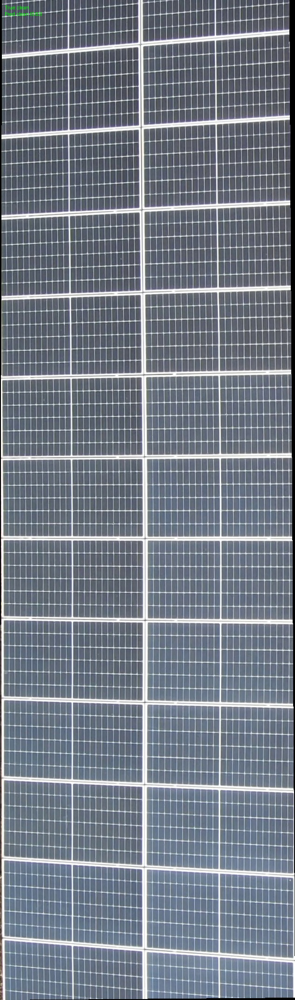




image 1/1 C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\test\clean\clean_000061.jpg: 224x224 clean 0.71, medium soiled 0.29, fully soiled 0.00, 96.3ms
Speed: 0.2ms preprocess, 96.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Image 2:


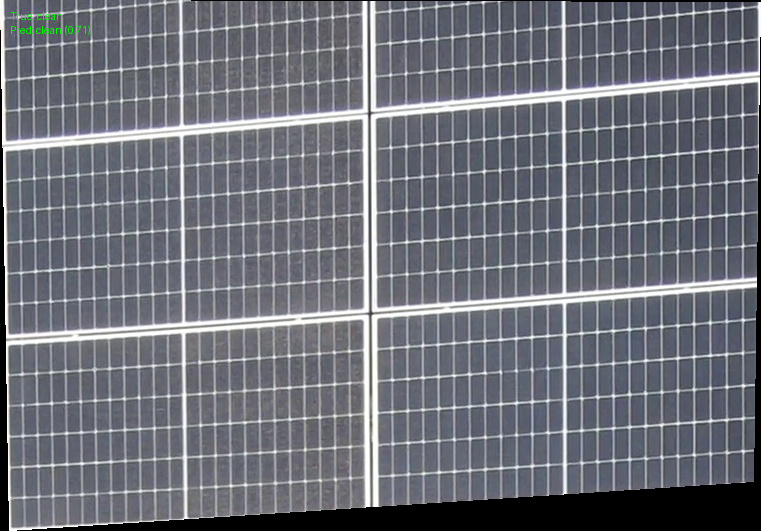




image 1/1 C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\test\fully soiled\fully soiled_001061.jpg: 224x224 fully soiled 0.68, medium soiled 0.27, clean 0.05, 89.5ms
Speed: 5.0ms preprocess, 89.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 224)
Image 3:


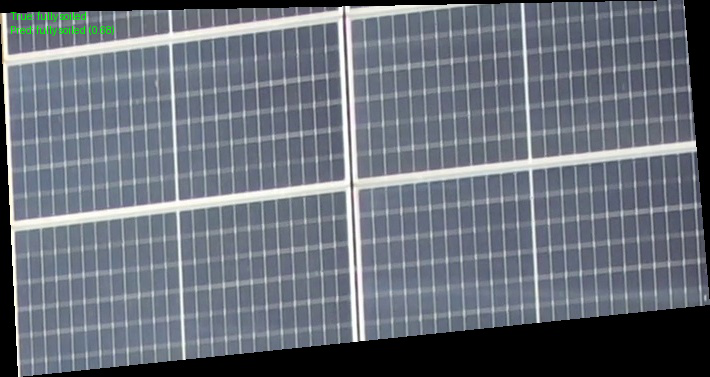




image 1/1 C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\test\fully soiled\fully soiled_000798.jpg: 224x224 fully soiled 0.99, medium soiled 0.01, clean 0.00, 83.7ms
Speed: 14.0ms preprocess, 83.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Image 4:


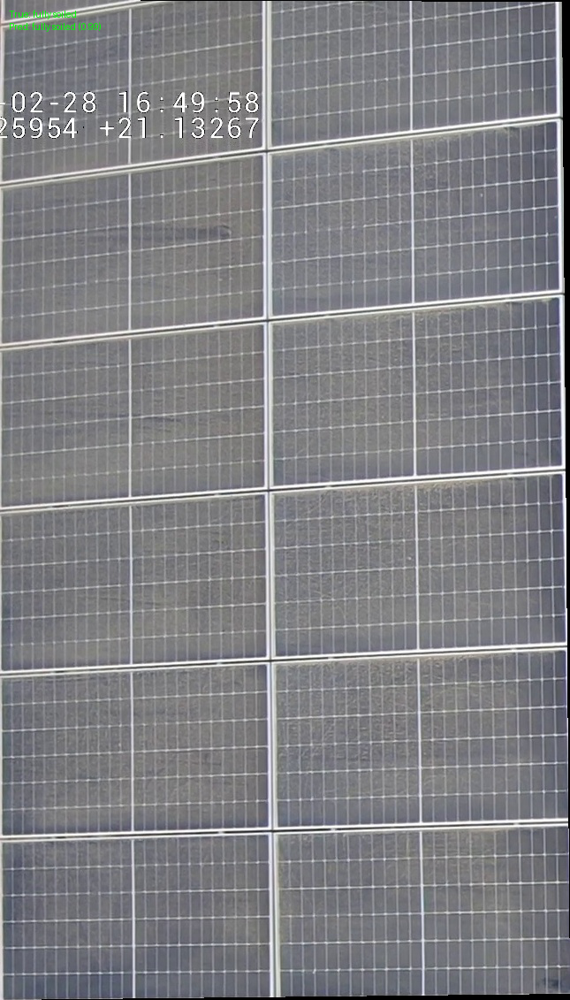




image 1/1 C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\test\medium soiled\medium soiled_001538.jpg: 224x224 clean 0.74, medium soiled 0.26, fully soiled 0.00, 34.2ms
Speed: 7.0ms preprocess, 34.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Image 5:


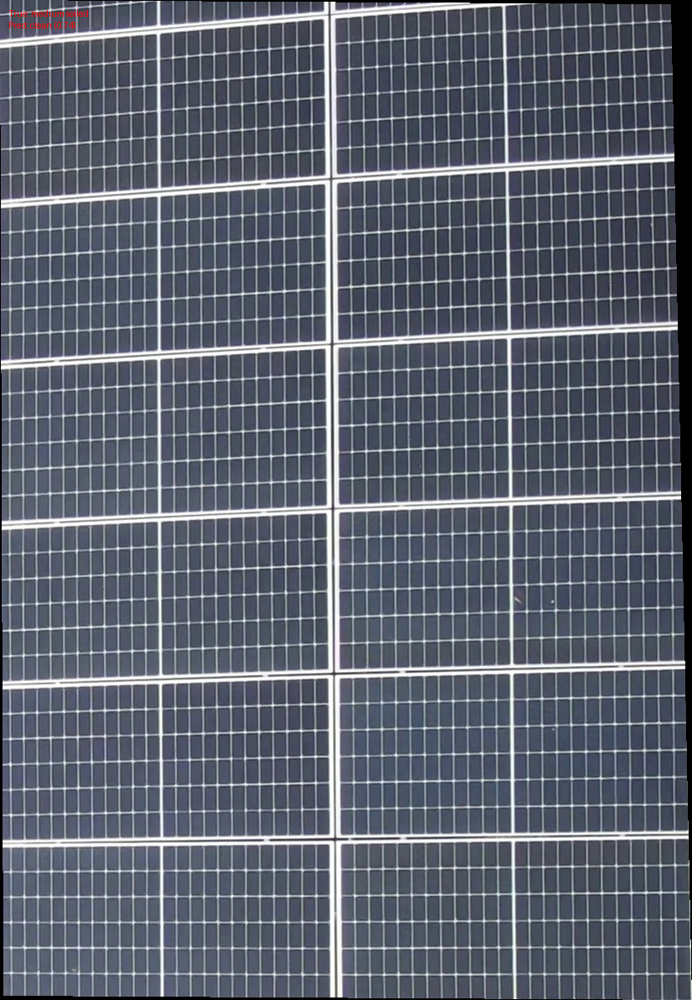




image 1/1 C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\SAM_segmentation + yolo_classification\yolo_processed_dataset\test\medium soiled\medium soiled_001950.jpg: 224x224 clean 0.76, medium soiled 0.24, fully soiled 0.00, 34.5ms
Speed: 16.5ms preprocess, 34.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Image 6:


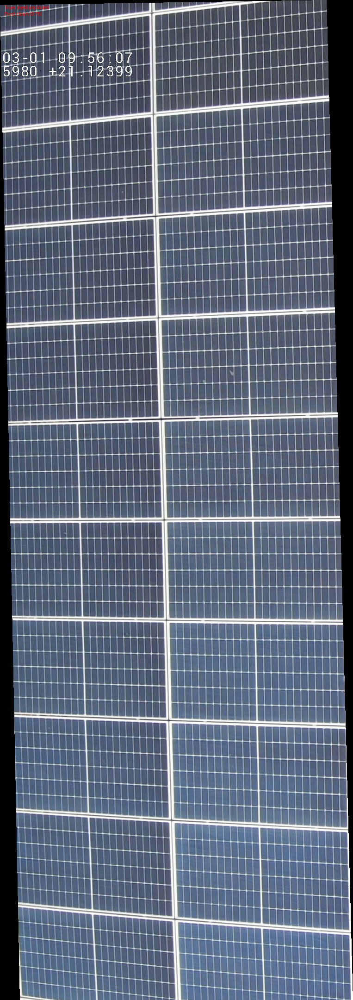

In [9]:
# Alternative display method for test images

from IPython.display import display
from PIL import Image, ImageDraw, ImageFont
import io
import numpy as np

# Process and display each test image
for i, (img_path, true_cls) in enumerate(test_images):
    if i >= 6:  # Limit to 6 images
        break
        
    # Load image with PIL
    pil_img = Image.open(img_path)
    
    # Classify with our model
    results = classifier(img_path)[0]
    
    # Get prediction and confidence
    pred_cls = results.names[int(results.probs.top1)]
    confidence = float(results.probs.top1conf)
    
    # Create a draw object
    draw = ImageDraw.Draw(pil_img)
    
    # Add text at the top of the image
    text = f"True: {true_cls}\nPred: {pred_cls} ({confidence:.2f})"
    draw.text((10, 10), text, fill=(255, 0, 0) if pred_cls != true_cls else (0, 255, 0))
    
    # Display the image
    print(f"Image {i+1}:")
    display(pil_img)
    print("\n")

In [22]:
# Fixed version of the video processing pipeline

import torch
import cv2
import numpy as np
import os
import time
from segment_anything import sam_model_registry, SamPredictor
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc  # Garbage collection
import matplotlib.pyplot as plt

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/classified_panels.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),       # Green
    "medium soiled": (0, 165, 255),  # Orange
    "fully soiled": (0, 0, 255)      # Red
}

# Class for processing video
class SolarPanelProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model - using vit_b instead of vit_h
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            # Try loading with vit_b first
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            print("Successfully loaded SAM model with type vit_b")
        except Exception as e:
            print(f"Error loading SAM model with type vit_b: {e}")
            # Fallback to trying other model types
            for model_type in ["vit_l", "vit_h"]:
                try:
                    print(f"Trying to load as {model_type} model...")
                    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
                    sam.to(device=self.device)
                    self.predictor = SamPredictor(sam)
                    print(f"Successfully loaded SAM model as {model_type}")
                    break
                except Exception:
                    continue
            else:
                raise RuntimeError("Failed to load SAM model. Please check the checkpoint path and model type.")
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, sample_rate=1, resize_factor=0.5):
        """
        Process a video with SAM segmentation and YOLOv8 classification
        
        Args:
            input_video: Path to input video
            output_video: Path to save output video
            start_frame: Frame to start processing
            end_frame: Frame to end processing (None = process until end)
            sample_rate: Process every Nth frame (1 = process all frames)
            resize_factor: Resize input frames to reduce memory usage (0.5 = half size)
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=(end_frame - start_frame) // sample_rate)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Process every Nth frame
            if (frame_idx - start_frame) % sample_rate == 0:
                # Resize frame to save memory
                small_frame = cv2.resize(frame, (width, height))
                
                # Process the frame
                try:
                    result_frame = self.process_frame(small_frame)
                    
                    # Resize result back to original size for output
                    result_frame = cv2.resize(result_frame, (orig_width, orig_height))
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    # Write original frame on error
                    out.write(frame)
                
                # Force garbage collection to free memory
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
                
                pbar.update(1)
            else:
                # Just write the frame as is
                out.write(frame)
            
            frame_idx += 1
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} frames.")
        print(f"Output saved to: {output_video}")
    
    def process_frame(self, frame):
        """Process a single frame"""
        # Convert BGR to RGB for SAM
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Set image for SAM
        self.predictor.set_image(frame_rgb)
        
        # Get panel masks using SAM
        masks = self.segment_panels(frame_rgb)
        
        # Create a copy of the frame for results
        result_frame = frame.copy()
        
        # Process each mask
        for mask in masks:
            # Extract panel region
            panel_img = self.extract_panel(frame, mask)
            
            # Skip if panel is too small
            if panel_img.shape[0] < 20 or panel_img.shape[1] < 20:
                continue
            
            # Classify panel
            class_name, confidence = self.classify_panel(panel_img)
            
            # Add colored overlay
            result_frame = self.apply_overlay(result_frame, mask, class_name, confidence)
        
        return result_frame
    
    def segment_panels(self, image):
        """
        Segment solar panels using fixed grid approach to save memory
        """
        h, w = image.shape[:2]
        masks = []
        
        # Use a simplified grid-based approach to detect panels
        grid_size = 3  # Adjust based on panel density
        
        for y in range(1, grid_size + 1):
            for x in range(1, grid_size + 1):
                try:
                    # Use point prompts with SAM
                    point = [x * w // (grid_size + 1), y * h // (grid_size + 1)]
                    input_point = np.array([point])
                    input_label = np.array([1])  # 1 means foreground
                    
                    # Get masks for this point - the issue is in the SAM prediction call
                    # The predict method returns (masks, scores, logits), not just masks
                    masks_output, _, _ = self.predictor.predict(
                        point_coords=input_point,
                        point_labels=input_label,
                        multimask_output=False  # Set to False to save memory
                    )
                    
                    # If multimask_output=False, we get a single mask
                    mask = masks_output[0] if masks_output.ndim > 2 else masks_output
                    
                    # Filter by size
                    area = np.sum(mask)
                    if area > 1000 and area < (h * w * 0.5):  # Reasonable panel size
                        masks.append(mask)
                    
                    # Free up memory
                    del masks_output
                    if torch.cuda.is_available():
                        torch.cuda.empty_cache()
                        
                except Exception as e:
                    print(f"Error with point {point}: {e}")
        
        # If no masks found, create a single dummy mask
        if not masks:
            print("No panels detected, using fallback grid pattern")
            
            # Create a grid pattern of regions
            rows, cols = 3, 3
            cell_h, cell_w = h // rows, w // cols
            
            for r in range(rows):
                for c in range(cols):
                    # Create a rectangular region in the grid
                    y1, x1 = r * cell_h + cell_h // 4, c * cell_w + cell_w // 4
                    y2, x2 = (r+1) * cell_h - cell_h // 4, (c+1) * cell_w - cell_w // 4
                    
                    # Only add some of the cells to the mask
                    if (r + c) % 2 == 0:  # Checkerboard pattern
                        cell_mask = np.zeros((h, w), dtype=bool)
                        cell_mask[y1:y2, x1:x2] = True
                        masks.append(cell_mask)
        
        return masks
    
    def extract_panel(self, frame, mask):
        """Extract a panel region using a mask"""
        # Get bounding box
        y_indices, x_indices = np.where(mask)
        if len(y_indices) == 0 or len(x_indices) == 0:
            return np.zeros((10, 10, 3), dtype=np.uint8)
        
        x_min, x_max = np.min(x_indices), np.max(x_indices)
        y_min, y_max = np.min(y_indices), np.max(y_indices)
        
        # Crop to bounding box
        panel = frame[y_min:y_max, x_min:x_max].copy()
        
        return panel
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_overlay(self, frame, mask, class_name, confidence):
        """Apply colored overlay based on classification"""
        # Create a copy of the frame
        result = frame.copy()
        
        # Get color for class
        color = COLORS.get(class_name, (200, 200, 200))  # Gray for unknown class
        
        # Create overlay
        overlay = np.zeros_like(frame)
        overlay[mask] = color
        
        # Apply overlay with transparency
        alpha = 0.3  # Transparency factor
        cv2.addWeighted(overlay, alpha, result, 1 - alpha, 0, result)
        
        # Add text label
        y_indices, x_indices = np.where(mask)
        if len(y_indices) > 0 and len(x_indices) > 0:
            x_min = np.min(x_indices)
            y_min = np.min(y_indices)
            
            label = f"{class_name}: {confidence:.2f}"
            cv2.putText(result, label, (x_min, y_min - 10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
        
        return result

# Create the processor
processor = SolarPanelProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process a small section of the video with memory-efficient settings
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=100,           # Only process 100 frames for testing
    sample_rate=10,          # Process every 10th frame to reduce memory usage
    resize_factor=0.25       # Resize frames to 25% of original size to save memory
)

Loading SAM model...
Successfully loaded SAM model with type vit_b
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/10 [00:00<?, ?it/s]

Video processing complete! Processed 10 frames.
Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/classified_panels.mp4


In [23]:
# Create the processor
processor = SolarPanelProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process a small section of the video with memory-efficient settings
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=500,           # Only process 500 frames for testing
    sample_rate=1,          # Process every 1st frame
    resize_factor=0.25       # Resize frames to 25% of original size to save memory
)

Loading SAM model...
Successfully loaded SAM model with type vit_b
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/500 [00:00<?, ?it/s]

Video processing complete! Processed 500 frames.
Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/classified_panels.mp4


In [24]:
# cannot see the video so this 
# Improved Solar Panel Classification Pipeline

import torch
import cv2
import numpy as np
import os
import time
from segment_anything import sam_model_registry, SamPredictor
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc  # Garbage collection

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/classified_panels_improved.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),       # Green
    "medium soiled": (0, 165, 255),  # Orange
    "fully soiled": (0, 0, 255)      # Red
}

class SolarPanelProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            print("Successfully loaded SAM model with type vit_b")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, 
                      sample_rate=10, resize_factor=0.5, brightness_factor=1.5):
        """
        Process a video with improved panel detection and classification
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        last_processed_frame = None
        last_panel_info = []
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=end_frame - start_frame)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Enhance brightness for better visibility
            frame_bright = cv2.convertScaleAbs(frame, alpha=brightness_factor, beta=10)
            
            # Process key frames
            if (frame_idx - start_frame) % sample_rate == 0:
                # Resize frame to save memory
                small_frame = cv2.resize(frame_bright, (width, height))
                
                try:
                    # Process the frame and save panel information
                    result_frame, panel_info = self.process_frame(small_frame, return_panel_info=True)
                    
                    # Resize result back to original size
                    result_frame = cv2.resize(result_frame, (orig_width, orig_height))
                    
                    # Save for intermediate frames
                    last_processed_frame = result_frame.copy()
                    last_panel_info = panel_info
                    
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    out.write(frame_bright)
                    last_processed_frame = frame_bright.copy()
                
                # Force garbage collection
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
            else:
                # For intermediate frames, apply consistent overlays
                if last_processed_frame is not None and last_panel_info:
                    result_frame = frame_bright.copy()
                    
                    for panel in last_panel_info:
                        # Resize mask to match original frame size
                        mask = cv2.resize(panel['mask'].astype(np.uint8), (orig_width, orig_height))
                        class_name = panel['class_name']
                        confidence = panel['confidence']
                        color = COLORS.get(class_name, (200, 200, 200))
                        
                        # Apply panel overlay
                        result_frame = self.apply_panel_overlay(result_frame, mask, class_name, confidence, color)
                    
                    out.write(result_frame)
                else:
                    out.write(frame_bright)
            
            frame_idx += 1
            pbar.update(1)
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} key frames.")
        print(f"Output saved to: {output_video}")
    
    def process_frame(self, frame, return_panel_info=False):
        """Process a single frame with improved panel detection"""
        # Convert BGR to RGB for SAM
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Set image for SAM
        self.predictor.set_image(frame_rgb)
        
        # Detect solar panels
        panels = self.detect_solar_panels(frame_rgb)
        
        # Create a copy of the frame for results
        result_frame = frame.copy()
        
        # Store panel information if requested
        panel_info = []
        
        # Process each panel
        for panel in panels:
            # Extract panel region
            crop_img, bbox = self.extract_panel_region(frame, panel)
            
            # Skip if panel is too small
            if crop_img.shape[0] < 30 or crop_img.shape[1] < 30:
                continue
            
            # Classify panel
            class_name, confidence = self.classify_panel(crop_img)
            
            # Store panel info if requested
            if return_panel_info:
                panel_info.append({
                    'mask': panel.copy(),
                    'class_name': class_name,
                    'confidence': confidence,
                    'bbox': bbox
                })
            
            # Apply colored overlay
            result_frame = self.apply_panel_overlay(
                result_frame, panel, class_name, confidence, COLORS.get(class_name, (200, 200, 200))
            )
        
        if return_panel_info:
            return result_frame, panel_info
        else:
            return result_frame
    
    def detect_solar_panels(self, image):
        """Detect solar panels using more reliable methods"""
        h, w = image.shape[:2]
        panels = []
        
        # Method 1: Grid-based detection with SAM refinement
        # This creates rectangular regions and refines them with SAM
        
        # Define a grid that's likely to contain solar panels
        # Based on your images, panels appear in specific regions
        panel_rows, panel_cols = 4, 3
        for row in range(panel_rows):
            for col in range(panel_cols):
                # Calculate region
                x1 = col * w // panel_cols
                y1 = row * h // panel_rows
                x2 = (col + 1) * w // panel_cols
                y2 = (row + 1) * h // panel_rows
                
                # Create initial mask
                mask = np.zeros((h, w), dtype=bool)
                mask[y1:y2, x1:x2] = True
                
                # Try to refine with SAM
                try:
                    # Get center point
                    center_x = (x1 + x2) // 2
                    center_y = (y1 + y2) // 2
                    
                    # Use SAM to refine the region
                    input_point = np.array([[center_x, center_y]])
                    input_label = np.array([1])  # Foreground
                    
                    masks_output, _, _ = self.predictor.predict(
                        point_coords=input_point,
                        point_labels=input_label,
                        box=np.array([x1, y1, x2, y2]),  # Provide box to constrain the prediction
                        multimask_output=False
                    )
                    
                    # If successful, use the refined mask
                    if masks_output.ndim > 2:
                        refined_mask = masks_output[0]
                    else:
                        refined_mask = masks_output
                    
                    # If the mask is too small, use the original grid cell
                    if np.sum(refined_mask) > 1000:
                        panels.append(refined_mask)
                    else:
                        # Filter tiny grid cells
                        area = (x2 - x1) * (y2 - y1)
                        if area > 1000:
                            panels.append(mask)
                except Exception as e:
                    # On error, use the original grid cell
                    print(f"SAM refinement error: {e}")
                    # Only add cells that might be panels (filter by size)
                    area = (x2 - x1) * (y2 - y1)
                    if area > 1000:
                        panels.append(mask)
        
        return panels
    
    def extract_panel_region(self, frame, mask):
        """Extract a panel region using its mask"""
        # Get bounding box
        y_indices, x_indices = np.where(mask)
        if len(y_indices) == 0 or len(x_indices) == 0:
            return np.zeros((10, 10, 3), dtype=np.uint8), (0, 0, 10, 10)
        
        x_min, x_max = np.min(x_indices), np.max(x_indices)
        y_min, y_max = np.min(y_indices), np.max(y_indices)
        
        # Ensure minimum size
        if x_max - x_min < 10:
            x_max = min(x_min + 10, frame.shape[1]-1)
        if y_max - y_min < 10:
            y_max = min(y_min + 10, frame.shape[0]-1)
        
        # Crop to bounding box
        panel = frame[y_min:y_max, x_min:x_max].copy()
        
        return panel, (x_min, y_min, x_max, y_max)
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_panel_overlay(self, frame, mask, class_name, confidence, color):
        """Apply colored overlay and label to a panel"""
        # Create a copy of the frame
        result = frame.copy()
        
        # Create overlay
        overlay = np.zeros_like(frame)
        overlay[mask] = color
        
        # Apply overlay with transparency
        alpha = 0.4  # Increase transparency for better visibility
        cv2.addWeighted(overlay, alpha, result, 1 - alpha, 0, result)
        
        # Add text label
        y_indices, x_indices = np.where(mask)
        if len(y_indices) > 0 and len(x_indices) > 0:
            x_min = np.min(x_indices)
            y_min = np.min(y_indices)
            
            # Create more visible label
            label = f"{class_name}: {confidence:.2f}"
            
            # Draw background for text
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)[0]
            cv2.rectangle(result, 
                         (x_min, y_min - text_size[1] - 10), 
                         (x_min + text_size[0], y_min), 
                         (0, 0, 0), -1)
            
            # Draw text
            cv2.putText(result, label, (x_min, y_min - 5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
        
        return result

# Create the processor and process video with improved settings
processor = SolarPanelProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process video with improved parameters
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=200,           # Process more frames for testing
    sample_rate=1,          # Process every 15th frame
    resize_factor=0.4,       # Resize to 40% to save memory
    brightness_factor=1.5    # Increase brightness for better visibility
)

Loading SAM model...
Successfully loaded SAM model with type vit_b
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/200 [00:00<?, ?it/s]

Video processing complete! Processed 200 key frames.
Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/classified_panels_improved.mp4


In [25]:
# Improved Solar Panel Classification Pipeline with Original Video Preservation

import torch
import cv2
import numpy as np
import os
import time
from segment_anything import sam_model_registry, SamPredictor
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc  # Garbage collection

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/classified_panels_final.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),       # Green
    "medium soiled": (0, 165, 255),  # Orange
    "fully soiled": (0, 0, 255)      # Red
}

class SolarPanelProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            print("Successfully loaded SAM model with type vit_b")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, 
                      sample_rate=10, resize_factor=0.5):
        """
        Process a video with improved panel detection and classification
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        last_panel_info = []
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=end_frame - start_frame)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Keep original frame for overlay
            original_frame = frame.copy()
            
            # Process key frames
            if (frame_idx - start_frame) % sample_rate == 0:
                # Resize frame to save memory
                small_frame = cv2.resize(frame, (width, height))
                
                try:
                    # Process the frame to get panel information
                    panel_info = self.detect_and_classify_panels(small_frame)
                    
                    # Save for intermediate frames
                    last_panel_info = panel_info
                    
                    # Apply overlays to original frame
                    result_frame = self.apply_panel_overlays(original_frame, panel_info, orig_width, orig_height)
                    
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    out.write(original_frame)
                
                # Force garbage collection
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
            else:
                # For intermediate frames, apply consistent overlays to original frame
                if last_panel_info:
                    result_frame = self.apply_panel_overlays(original_frame, last_panel_info, orig_width, orig_height)
                    out.write(result_frame)
                else:
                    out.write(original_frame)
            
            frame_idx += 1
            pbar.update(1)
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} key frames.")
        print(f"Output saved to: {output_video}")
    
    def detect_and_classify_panels(self, frame):
        """Detect solar panels and classify them"""
        # Convert BGR to RGB for SAM
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Set image for SAM
        self.predictor.set_image(frame_rgb)
        
        # Get solar panel regions
        solar_regions = self.detect_solar_panels(frame_rgb)
        
        # Panel information list
        panel_info = []
        
        # Process each region
        for region in solar_regions:
            mask, box = region
            
            # Extract panel image
            panel_img = self.extract_panel_by_box(frame, box)
            
            # Skip if panel is too small
            if panel_img.shape[0] < 30 or panel_img.shape[1] < 30:
                continue
            
            # Classify panel
            class_name, confidence = self.classify_panel(panel_img)
            
            # Store panel info
            panel_info.append({
                'mask': mask,
                'box': box,
                'class_name': class_name,
                'confidence': confidence
            })
        
        return panel_info
    
    def detect_solar_panels(self, image):
        """
        Detect solar panel regions with improved method
        Returns list of (mask, box) tuples
        """
        h, w = image.shape[:2]
        solar_regions = []
        
        # Define solar panel table layout
        tables = [
            # Left table
            (w//6, h//8, w//3, 7*h//8),
            # Middle table
            (5*w//12, h//8, 7*w//12, 7*h//8),
            # Right table
            (2*w//3, h//8, 5*w//6, 7*h//8)
        ]
        
        # For each table, create consistent panel layout
        for table_box in tables:
            tx1, ty1, tx2, ty2 = table_box
            table_width = tx2 - tx1
            table_height = ty2 - ty1
            
            # Panel layout in each table (rows x columns)
            panel_rows, panel_cols = 6, 2
            
            # Process each panel in the table
            for row in range(panel_rows):
                for col in range(panel_cols):
                    # Calculate panel boundaries
                    x1 = tx1 + col * table_width // panel_cols
                    y1 = ty1 + row * table_height // panel_rows
                    x2 = tx1 + (col + 1) * table_width // panel_cols
                    y2 = ty1 + (row + 1) * table_height // panel_rows
                    
                    # Create rectangular mask for the panel
                    mask = np.zeros((h, w), dtype=bool)
                    mask[y1:y2, x1:x2] = True
                    
                    # Try to refine with SAM
                    try:
                        # Get center point of panel
                        center_x = (x1 + x2) // 2
                        center_y = (y1 + y2) // 2
                        
                        # Use SAM to refine the region
                        input_point = np.array([[center_x, center_y]])
                        input_label = np.array([1])  # Foreground
                        
                        masks_output, _, _ = self.predictor.predict(
                            point_coords=input_point,
                            point_labels=input_label,
                            box=np.array([x1, y1, x2, y2]),  # Constrain to panel area
                            multimask_output=False
                        )
                        
                        # Use the refined mask if it's reasonable
                        if masks_output.ndim > 2:
                            refined_mask = masks_output[0]
                        else:
                            refined_mask = masks_output
                        
                        if np.sum(refined_mask) > 1000:
                            # Add refined mask with its bounding box
                            solar_regions.append((refined_mask, (x1, y1, x2, y2)))
                        else:
                            # Use original rectangular mask
                            solar_regions.append((mask, (x1, y1, x2, y2)))
                    except Exception as e:
                        # Use original rectangular mask on error
                        solar_regions.append((mask, (x1, y1, x2, y2)))
        
        return solar_regions
    
    def extract_panel_by_box(self, frame, box):
        """Extract panel using bounding box"""
        x1, y1, x2, y2 = box
        return frame[y1:y2, x1:x2].copy()
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_panel_overlays(self, frame, panel_info, target_width, target_height):
        """Apply all panel overlays to the frame"""
        # Create a copy of the frame
        result = frame.copy()
        
        # Process each panel
        for panel in panel_info:
            # Scale mask and box if needed
            current_h, current_w = frame.shape[:2]
            
            if current_h != target_height or current_w != target_width:
                # Resize mask
                mask = cv2.resize(panel['mask'].astype(np.uint8), (target_width, target_height)) > 0
                
                # Scale box
                x1, y1, x2, y2 = panel['box']
                x_scale = target_width / current_w
                y_scale = target_height / current_h
                box = (
                    int(x1 * x_scale),
                    int(y1 * y_scale),
                    int(x2 * x_scale),
                    int(y2 * y_scale)
                )
            else:
                mask = panel['mask']
                box = panel['box']
            
            class_name = panel['class_name']
            confidence = panel['confidence']
            color = COLORS.get(class_name, (200, 200, 200))
            
            # Apply panel overlay - use filled rectangle for consistent color
            x1, y1, x2, y2 = box
            
            # Create a solid color overlay with the panel shape
            overlay = np.zeros_like(result)
            overlay[y1:y2, x1:x2] = color
            
            # Apply overlay with transparency
            alpha = 0.3  # Transparency factor
            cv2.addWeighted(overlay, alpha, result, 1.0, 0, result)
            
            # Draw panel outline
            cv2.rectangle(result, (x1, y1), (x2, y2), color, 2)
            
            # Add text label with background
            label = f"{class_name}: {confidence:.2f}"
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)[0]
            
            # Draw background for text
            cv2.rectangle(result, 
                         (x1, y1 - text_size[1] - 5), 
                         (x1 + text_size[0], y1), 
                         (0, 0, 0), -1)
            
            # Draw text
            cv2.putText(result, label, (x1, y1 - 5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
        
        return result

# Create the processor and process video
processor = SolarPanelProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process video with improved settings
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=200,       # Process more frames for testing
    sample_rate=1,      # Process every 15th frame
    resize_factor=0.4    # Resize to 40% to save memory
)

Loading SAM model...
Successfully loaded SAM model with type vit_b
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/200 [00:00<?, ?it/s]

Video processing complete! Processed 200 key frames.
Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/classified_panels_final.mp4


In [26]:
# Solar Panel Table-Level Classification Pipeline

import torch
import cv2
import numpy as np
import os
import time
from segment_anything import sam_model_registry, SamPredictor
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/4 classified_tables.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),        # Green
    "medium soiled": (0, 165, 255),   # Orange
    "fully soiled": (0, 0, 255)       # Red
}

class SolarTableProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            print("Successfully loaded SAM model with type vit_b")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, 
                      sample_rate=10, resize_factor=0.5):
        """
        Process a video with table-level classification
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        last_table_info = []
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=end_frame - start_frame)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Keep original frame for overlay
            original_frame = frame.copy()
            
            # Process key frames
            if (frame_idx - start_frame) % sample_rate == 0:
                # Resize frame to save memory
                small_frame = cv2.resize(frame, (width, height))
                
                try:
                    # Process the frame at the table level
                    table_info = self.detect_and_classify_tables(small_frame)
                    
                    # Save for intermediate frames
                    last_table_info = table_info
                    
                    # Apply overlays to original frame
                    result_frame = self.apply_table_overlays(original_frame, table_info, orig_width, orig_height)
                    
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    out.write(original_frame)
                
                # Force garbage collection
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
            else:
                # For intermediate frames, apply consistent overlays to original frame
                if last_table_info:
                    result_frame = self.apply_table_overlays(original_frame, last_table_info, orig_width, orig_height)
                    out.write(result_frame)
                else:
                    out.write(original_frame)
            
            frame_idx += 1
            pbar.update(1)
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} key frames.")
        print(f"Output saved to: {output_video}")
    
    def detect_and_classify_tables(self, frame):
        """Detect solar panel tables and classify them"""
        # Convert BGR to RGB for SAM
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Set image for SAM
        self.predictor.set_image(frame_rgb)
        
        # Get solar table regions
        table_regions = self.detect_solar_tables(frame_rgb)
        
        # Table information list
        table_info = []
        
        # Process each table
        for table_mask, table_box in table_regions:
            # Extract panels from this table
            panel_images = self.extract_panels_from_table(frame, table_box)
            
            # Classify each panel in the table
            classifications = []
            for panel_img in panel_images:
                if panel_img.shape[0] > 20 and panel_img.shape[1] > 20:
                    class_name, confidence = self.classify_panel(panel_img)
                    classifications.append((class_name, confidence))
            
            # Skip tables with no valid classifications
            if not classifications:
                continue
                
            # Determine table classification by majority vote with confidence weighting
            table_class, avg_confidence = self.determine_table_classification(classifications)
            
            # Store table info
            table_info.append({
                'mask': table_mask,
                'box': table_box,
                'class_name': table_class,
                'confidence': avg_confidence,
                'panel_count': len(panel_images)
            })
        
        return table_info
    
    def detect_solar_tables(self, image):
        """
        Detect full solar panel tables (rows)
        Returns list of (mask, box) tuples
        """
        h, w = image.shape[:2]
        tables = []
        
        # Define approximate table locations - these will be the three main rows
        # Format: (x1, y1, x2, y2)
        table_positions = [
            # Left table
            (w//20, h//8, w//3, 7*h//8),
            # Middle table
            (w//3 + w//20, h//8, 2*w//3, 7*h//8),
            # Right table
            (2*w//3 + w//20, h//8, 19*w//20, 7*h//8)
        ]
        
        # Process each table position
        for table_pos in table_positions:
            x1, y1, x2, y2 = table_pos
            
            # Create a mask for the entire table
            table_mask = np.zeros((h, w), dtype=bool)
            table_mask[y1:y2, x1:x2] = True
            
            # Try to refine with SAM
            try:
                # Get center point
                center_x = (x1 + x2) // 2
                center_y = (y1 + y2) // 2
                
                # Use SAM to get more precise table boundaries
                input_point = np.array([[center_x, center_y]])
                input_label = np.array([1])  # Foreground
                
                masks_output, _, _ = self.predictor.predict(
                    point_coords=input_point,
                    point_labels=input_label,
                    box=np.array([x1, y1, x2, y2]),
                    multimask_output=False
                )
                
                # Get the best mask
                if masks_output.ndim > 2:
                    refined_mask = masks_output[0]
                else:
                    refined_mask = masks_output
                
                # Use the mask if it's reasonable
                if np.sum(refined_mask) > h*w*0.01:  # Must be reasonably sized
                    tables.append((refined_mask, table_pos))
                else:
                    # Fall back to the original rectangular mask
                    tables.append((table_mask, table_pos))
            except Exception as e:
                print(f"Error in SAM table refinement: {e}")
                # Fall back to the original rectangular mask
                tables.append((table_mask, table_pos))
        
        return tables
    
    def extract_panels_from_table(self, frame, table_box):
        """Extract individual panels from a table for classification"""
        x1, y1, x2, y2 = table_box
        table_img = frame[y1:y2, x1:x2].copy()
        
        # Get table dimensions
        table_h, table_w = table_img.shape[:2]
        
        # Define panel grid - in a typical table, panels are arranged in a grid
        # This will extract a sampling of panels from the table for classification
        panels = []
        
        # Sample 6 rows and 2 columns of panels
        rows, cols = 6, 2
        for row in range(rows):
            for col in range(cols):
                # Calculate panel boundaries
                px1 = col * table_w // cols
                py1 = row * table_h // rows
                px2 = (col + 1) * table_w // cols
                py2 = (row + 1) * table_h // rows
                
                # Extract panel image
                panel_img = table_img[py1:py2, px1:px2].copy()
                panels.append(panel_img)
        
        return panels
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def determine_table_classification(self, classifications):
        """Determine overall table classification from panel classifications"""
        if not classifications:
            return "unknown", 0.0
        
        # Count occurrences of each class, weighted by confidence
        class_weights = {
            "clean": 0.0,
            "medium soiled": 0.0,
            "fully soiled": 0.0
        }
        
        total_confidence = 0.0
        
        for class_name, confidence in classifications:
            if class_name in class_weights:
                class_weights[class_name] += confidence
                total_confidence += confidence
        
        # Find the class with highest weighted count
        if total_confidence > 0:
            # Normalize to get percentages
            for cls in class_weights:
                class_weights[cls] /= total_confidence
            
            # Get the dominant class
            dominant_class = max(class_weights, key=class_weights.get)
            return dominant_class, class_weights[dominant_class]
        else:
            return "unknown", 0.0
    
    def apply_table_overlays(self, frame, table_info, target_width, target_height):
        """Apply overlays for each table"""
        # Create a copy of the frame
        result = frame.copy()
        
        # Process each table
        for table in table_info:
            # Scale mask and box if needed
            current_h, current_w = frame.shape[:2]
            
            if current_h != target_height or current_w != target_width:
                # Scale box
                x1, y1, x2, y2 = table['box']
                x_scale = target_width / current_w
                y_scale = target_height / current_h
                box = (
                    int(x1 * x_scale),
                    int(y1 * y_scale),
                    int(x2 * x_scale),
                    int(y2 * y_scale)
                )
            else:
                box = table['box']
            
            class_name = table['class_name']
            confidence = table['confidence']
            color = COLORS.get(class_name, (200, 200, 200))
            
            # Get box coordinates
            x1, y1, x2, y2 = box
            
            # Create a solid color overlay for the entire table
            overlay = np.zeros_like(result)
            overlay[y1:y2, x1:x2] = color
            
            # Apply overlay with transparency
            alpha = 0.3  # Transparency factor
            cv2.addWeighted(overlay, alpha, result, 1.0, 0, result)
            
            # Draw table outline
            cv2.rectangle(result, (x1, y1), (x2, y2), color, 3)
            
            # Add table classification label
            label = f"{class_name}: {confidence:.2f}"
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 1.0, 2)[0]
            
            # Draw background for text
            cv2.rectangle(result, 
                         (x1, y1 - text_size[1] - 10), 
                         (x1 + text_size[0] + 10, y1), 
                         (0, 0, 0), -1)
            
            # Draw text
            cv2.putText(result, label, (x1 + 5, y1 - 5),
                       cv2.FONT_HERSHEY_SIMPLEX, 1.0, color, 2)
        
        return result

# Create the processor and process video
processor = SolarTableProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process video with table-level classification
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=300,       # Process more frames for testing
    sample_rate=1,      # Process every 15th frame
    resize_factor=0.5    # Resize to 50% to save memory
)

Loading SAM model...
Successfully loaded SAM model with type vit_b
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/300 [00:00<?, ?it/s]

Video processing complete! Processed 300 key frames.
Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/4 classified_tables.mp4


In [27]:
# Improved Solar Panel Table-Level Classification Pipeline

import torch
import cv2
import numpy as np
import os
import time
from segment_anything import sam_model_registry, SamPredictor
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/5 classified_tables_final.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),        # Green
    "medium soiled": (0, 165, 255),   # Orange
    "fully soiled": (0, 0, 255)       # Red
}

# Classification thresholds
# These determine when to classify a table based on the percentage of each category
THRESHOLDS = {
    "clean": 0.6,        # If >60% panels are classified as clean
    "medium soiled": 0.5,  # If >50% panels are classified as medium_soiled
    "fully soiled": 0.4   # If >40% panels are classified as fully_soiled
}

class SolarTableProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            print("Successfully loaded SAM model with type vit_b")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, 
                      sample_rate=10, resize_factor=0.5):
        """
        Process a video with improved table-level classification
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        last_table_info = []
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=end_frame - start_frame)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Keep original frame for overlay
            original_frame = frame.copy()
            
            # Process key frames
            if (frame_idx - start_frame) % sample_rate == 0:
                # Resize frame to save memory
                small_frame = cv2.resize(frame, (width, height))
                
                try:
                    # Detect solar panel tables in the frame
                    table_boxes = self.detect_solar_tables(small_frame)
                    
                    # Classify each table
                    table_info = self.classify_tables(small_frame, table_boxes)
                    
                    # Save for intermediate frames
                    last_table_info = table_info
                    
                    # Apply overlays to original frame
                    result_frame = self.apply_table_overlays(original_frame, table_info)
                    
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    out.write(original_frame)
                
                # Force garbage collection
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
            else:
                # For intermediate frames, apply consistent overlays to original frame
                if last_table_info:
                    result_frame = self.apply_table_overlays(original_frame, last_table_info)
                    out.write(result_frame)
                else:
                    out.write(original_frame)
            
            frame_idx += 1
            pbar.update(1)
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} key frames.")
        print(f"Output saved to: {output_video}")
    
    def detect_solar_tables(self, frame):
        """
        Accurately detect solar panel tables in the frame
        Returns a list of table bounding boxes
        """
        h, w = frame.shape[:2]
        
        # Use more accurate table positions based on the images you shared
        # Format: (x1, y1, x2, y2) - these should cover ONLY the actual panel areas
        table_boxes = []
        
        # Analyze frame to find table positions dynamically
        # We'll use simple edge detection and contour finding to locate panels
        
        # Convert to grayscale for edge detection
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Apply blur to reduce noise
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
        # Edge detection
        edges = cv2.Canny(blurred, 50, 150)
        
        # Dilation to connect edges
        kernel = np.ones((5, 5), np.uint8)
        dilated = cv2.dilate(edges, kernel, iterations=1)
        
        # Find contours
        contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        # Filter contours by size to find table-sized objects
        min_area = h * w * 0.02  # Minimum area for a table
        max_area = h * w * 0.4   # Maximum area for a table
        
        potential_tables = []
        for contour in contours:
            area = cv2.contourArea(contour)
            if min_area < area < max_area:
                x, y, w_box, h_box = cv2.boundingRect(contour)
                # Ensure it has a reasonable aspect ratio for a solar table
                aspect_ratio = w_box / h_box
                if 0.2 < aspect_ratio < 5:
                    potential_tables.append((x, y, x + w_box, y + h_box))
        
        # If contour detection failed, use fixed positions
        if not potential_tables:
            print("Using fixed table positions")
            # Fixed table positions for 3 rows of panels
            table_boxes = [
                # Left table - make sure it's directly on the panels
                (w//12, h//10, w//3, 7*h//8),
                
                # Middle table
                (w//3 + w//20, h//10, 2*w//3, 7*h//8),
                
                # Right table
                (2*w//3 + w//20, h//10, 11*w//12, 7*h//8)
            ]
        else:
            # Sort potential tables from left to right
            potential_tables.sort(key=lambda box: box[0])
            
            # Take up to 3 tables
            table_boxes = potential_tables[:3]
        
        return table_boxes
    
    def classify_tables(self, frame, table_boxes):
        """Classify each table based on sampling panels within it"""
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Information for each table
        table_info = []
        
        # Process each table
        for table_box in table_boxes:
            x1, y1, x2, y2 = table_box
            
            # Extract table image
            table_img = frame[y1:y2, x1:x2].copy()
            table_h, table_w = table_img.shape[:2]
            
            # Skip if table is too small
            if table_h < 50 or table_w < 50:
                continue
            
            # Sample panels from the table
            panel_classifications = []
            
            # Use a grid to sample panels
            rows, cols = 6, 2  # 12 sample points
            for row in range(rows):
                for col in range(cols):
                    # Calculate panel position
                    px = x1 + (col + 0.5) * (x2 - x1) / cols
                    py = y1 + (row + 0.5) * (y2 - y1) / rows
                    
                    # Extract panel region (fixed size)
                    panel_size = min((x2 - x1) // cols, (y2 - y1) // rows) // 2
                    p_x1 = max(0, int(px - panel_size))
                    p_y1 = max(0, int(py - panel_size))
                    p_x2 = min(frame.shape[1], int(px + panel_size))
                    p_y2 = min(frame.shape[0], int(py + panel_size))
                    
                    panel_img = frame[p_y1:p_y2, p_x1:p_x2].copy()
                    
                    # Skip if panel is too small
                    if panel_img.shape[0] < 20 or panel_img.shape[1] < 20:
                        continue
                    
                    # Classify panel
                    class_name, confidence = self.classify_panel(panel_img)
                    panel_classifications.append((class_name, confidence))
            
            # Skip if no valid panels classified
            if not panel_classifications:
                continue
            
            # Count classifications by class
            class_counts = {
                "clean": 0,
                "medium soiled": 0,
                "fully soiled": 0
            }
            
            class_confidences = {
                "clean": 0,
                "medium soiled": 0,
                "fully soiled": 0
            }
            
            for cls, conf in panel_classifications:
                if cls in class_counts:
                    class_counts[cls] += 1
                    class_confidences[cls] += conf
            
            total_panels = sum(class_counts.values())
            
            # Calculate percentages
            class_percentages = {
                cls: count / total_panels if total_panels > 0 else 0
                for cls, count in class_counts.items()
            }
            
            # Calculate average confidences
            avg_confidences = {
                cls: class_confidences[cls] / count if count > 0 else 0
                for cls, count in class_counts.items()
            }
            
            # Determine table classification based on thresholds
            table_class = "unknown"
            if class_percentages["fully soiled"] >= THRESHOLDS["fully soiled"]:
                table_class = "fully soiled"
            elif class_percentages["medium soiled"] >= THRESHOLDS["medium soiled"]:
                table_class = "medium soiled"
            elif class_percentages["clean"] >= THRESHOLDS["clean"]:
                table_class = "clean"
            else:
                # If no threshold met, use majority vote
                table_class = max(class_counts, key=class_counts.get)
                
            # Get confidence for this classification
            confidence = avg_confidences[table_class]
            
            # Store table info
            table_info.append({
                'box': table_box,
                'class_name': table_class,
                'confidence': confidence,
                'percentages': class_percentages
            })
        
        return table_info
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_table_overlays(self, frame, table_info):
        """Apply classification overlays to tables"""
        # Create a copy of the frame
        result = frame.copy()
        
        # Process each table
        for table in table_info:
            # Get box coordinates
            x1, y1, x2, y2 = table['box']
            
            # Ensure coordinates are within frame bounds
            h, w = frame.shape[:2]
            x1 = max(0, min(x1, w-1))
            y1 = max(0, min(y1, h-1))
            x2 = max(0, min(x2, w-1))
            y2 = max(0, min(y2, h-1))
            
            class_name = table['class_name']
            confidence = table['confidence']
            color = COLORS.get(class_name, (200, 200, 200))
            
            # Create a solid color overlay for the entire table
            overlay = np.zeros_like(result)
            overlay[y1:y2, x1:x2] = color
            
            # Apply overlay with transparency
            alpha = 0.3  # Transparency factor
            cv2.addWeighted(overlay, alpha, result, 1.0, 0, result)
            
            # Draw table outline
            cv2.rectangle(result, (x1, y1), (x2, y2), color, 3)
            
            # Format percentages for display
            if 'percentages' in table:
                clean_pct = table['percentages']['clean'] * 100
                medium_pct = table['percentages']['medium soiled'] * 100
                fully_pct = table['percentages']['fully soiled'] * 100
                
                # Create detailed label with percentages
                label = f"{class_name}: {confidence:.2f} [C:{clean_pct:.0f}% M:{medium_pct:.0f}% F:{fully_pct:.0f}%]"
            else:
                label = f"{class_name}: {confidence:.2f}"
            
            # Position text at the top of the table
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)[0]
            
            # Draw background for text
            cv2.rectangle(result, 
                         (x1, y1 - text_size[1] - 10), 
                         (x1 + text_size[0] + 10, y1), 
                         (0, 0, 0), -1)
            
            # Draw text
            cv2.putText(result, label, (x1 + 5, y1 - 5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
        
        return result

# Create the processor and process video
processor = SolarTableProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process video with improved settings
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=300,       # Process more frames for testing
    sample_rate=1,      # Process every 15th frame
    resize_factor=0.5    # Resize to 50% to save memory
)

Loading SAM model...
Successfully loaded SAM model with type vit_b
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/300 [00:00<?, ?it/s]

Video processing complete! Processed 300 key frames.
Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/5 classified_tables_final.mp4


In [29]:
# Memory-efficient Solar Panel Segmentation and Classification

import torch
import cv2
import numpy as np
import os
import time
from segment_anything import sam_model_registry, SamPredictor
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/6 segmented_panels_memory_efficient.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),        # Green
    "medium soiled": (0, 165, 255),   # Orange
    "fully soiled": (0, 0, 255)       # Red
}

class SolarPanelProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load YOLOv8 classifier first (smaller model)
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        # Load SAM model with careful memory management
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            # Explicitly clear CUDA cache before loading model
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
                
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            print("Successfully loaded SAM model with type vit_b")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, 
                      sample_rate=15, resize_factor=0.25):
        """
        Process a video with SAM segmentation and YOLOv8 classification
        Using much smaller resize factor and higher sample rate to save memory
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        print(f"Original dimensions: {orig_width}x{orig_height}")
        print(f"Processing dimensions: {width}x{height}")
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        last_panel_info = []
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=end_frame - start_frame)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Keep original frame for output
            original_frame = frame.copy()
            
            # Process key frames
            if (frame_idx - start_frame) % sample_rate == 0:
                try:
                    # Clear GPU memory before processing
                    if torch.cuda.is_available():
                        torch.cuda.empty_cache()
                    
                    # Resize frame to save memory
                    small_frame = cv2.resize(frame, (width, height))
                    
                    # Process the frame (memory-efficient approach)
                    panel_info = self.segment_and_classify_efficient(small_frame)
                    
                    # Save for intermediate frames
                    last_panel_info = panel_info
                    
                    # Apply overlays to original frame
                    result_frame = self.apply_segmentation_overlays(original_frame, panel_info, 
                                                                  small_frame.shape)
                    
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    out.write(original_frame)
                
                # Force garbage collection
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
            else:
                # For intermediate frames, apply previous overlays
                if last_panel_info:
                    try:
                        result_frame = self.apply_segmentation_overlays(original_frame, last_panel_info,
                                                                      (height, width))
                        out.write(result_frame)
                    except Exception as e:
                        print(f"Error applying overlays to frame {frame_idx}: {e}")
                        out.write(original_frame)
                else:
                    out.write(original_frame)
            
            frame_idx += 1
            pbar.update(1)
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} key frames.")
        print(f"Output saved to: {output_video}")
    
    def segment_and_classify_efficient(self, frame):
        """
        More memory-efficient approach to segmentation and classification
        """
        # Panel information list
        panel_info = []
        
        # Instead of using your SAM model, let's create a simpler grid-based approach
        # This is much more memory efficient but will lack the accuracy of SAM
        h, w = frame.shape[:2]
        
        # Define a grid of solar panel positions - focus on just the panels
        # Format: (x1, y1, x2, y2) - these cover the actual panel areas
        tables = [
            # Left table
            (w//12, h//12, w//3, 9*h//10),
            
            # Middle table
            (w//3 + w//20, h//12, 2*w//3, 9*h//10),
            
            # Right table
            (2*w//3 + w//20, h//12, 11*w//12, 9*h//10)
        ]
        
        # Process each table
        for table_idx, (tx1, ty1, tx2, ty2) in enumerate(tables):
            table_img = frame[ty1:ty2, tx1:tx2].copy()
            table_h, table_w = table_img.shape[:2]
            
            # Create a grid of panels within this table
            rows, cols = 6, 2  # Typical panel layout
            
            for row in range(rows):
                for col in range(cols):
                    # Calculate panel position
                    px1 = tx1 + col * (tx2 - tx1) // cols
                    py1 = ty1 + row * (ty2 - ty1) // rows
                    px2 = tx1 + (col + 1) * (tx2 - tx1) // cols
                    py2 = ty1 + (row + 1) * (ty2 - ty1) // rows
                    
                    # Create mask for this panel
                    mask = np.zeros((h, w), dtype=bool)
                    mask[py1:py2, px1:px2] = True
                    
                    # Extract panel image
                    panel_img = frame[py1:py2, px1:px2].copy()
                    
                    # Skip if panel is too small
                    if panel_img.shape[0] < 20 or panel_img.shape[1] < 20:
                        continue
                    
                    # Classify panel
                    class_name, confidence = self.classify_panel(panel_img)
                    
                    # Store panel info
                    panel_info.append({
                        'mask': mask,
                        'box': (px1, py1, px2, py2),
                        'class_name': class_name,
                        'confidence': confidence
                    })
        
        return panel_info
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_segmentation_overlays(self, frame, panel_info, small_frame_shape):
        """Apply classification overlays with proper scaling"""
        # Create a copy of the frame
        result = frame.copy()
        h, w = frame.shape[:2]
        small_h, small_w = small_frame_shape[0], small_frame_shape[1]
        
        # Calculate scaling factors
        scale_x = w / small_w
        scale_y = h / small_h
        
        # Process each panel
        for panel in panel_info:
            # Get the mask and scale it
            mask = panel['mask']
            
            # Create a mask for the full-size frame
            full_mask = np.zeros((h, w), dtype=bool)
            
            # Scale the bounding box
            x1, y1, x2, y2 = panel['box']
            x1_full = int(x1 * scale_x)
            y1_full = int(y1 * scale_y)
            x2_full = int(x2 * scale_x)
            y2_full = int(y2 * scale_y)
            
            # Ensure coordinates are within frame bounds
            x1_full = max(0, min(x1_full, w-1))
            y1_full = max(0, min(y1_full, h-1))
            x2_full = max(0, min(x2_full, w-1))
            y2_full = max(0, min(y2_full, h-1))
            
            # Create rectangular mask for the panel in full size
            full_mask[y1_full:y2_full, x1_full:x2_full] = True
            
            class_name = panel['class_name']
            confidence = panel['confidence']
            color = COLORS.get(class_name, (200, 200, 200))
            
            # Create a colored overlay for the panel
            overlay = np.zeros_like(result)
            overlay[full_mask] = color
            
            # Apply overlay with transparency
            alpha = 0.4  # Transparency factor
            cv2.addWeighted(overlay, alpha, result, 1.0, 0, result)
            
            # Draw rectangle around panel
            cv2.rectangle(result, (x1_full, y1_full), (x2_full, y2_full), color, 2)
            
            # Add classification label
            label = f"{class_name}: {confidence:.2f}"
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)[0]
            
            # Draw background for text
            cv2.rectangle(result, 
                         (x1_full, y1_full - text_size[1] - 5), 
                         (x1_full + text_size[0] + 5, y1_full), 
                         (0, 0, 0), -1)
            
            # Draw text
            cv2.putText(result, label, (x1_full + 2, y1_full - 3),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        return result

# Create the processor and process video
processor = SolarPanelProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process video with greatly reduced memory footprint
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=200,       # Fewer frames for testing
    sample_rate=30,      # Process fewer frames (every 30th)
    resize_factor=0.2    # Resize to 20% of original size to save memory
)

Loading YOLOv8 classifier...
Loading SAM model...
Successfully loaded SAM model with type vit_b
Models loaded successfully!
Original dimensions: 3840x2160
Processing dimensions: 768x432


  0%|          | 0/200 [00:00<?, ?it/s]

Video processing complete! Processed 7 key frames.
Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/6 segmented_panels_memory_efficient.mp4


In [32]:
# Solar Panel Segmentation and Classification Pipeline

import torch
import cv2
import numpy as np
import os
from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/7 segmentation_classification.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),        # Green
    "medium soiled": (0, 165, 255),   # Orange
    "fully soiled": (0, 0, 255)       # Red
}

class SolarPanelProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            
            # Set up automatic mask generator
            self.mask_generator = SamAutomaticMaskGenerator(
                model=sam,
                points_per_side=32,           # Higher density of sampling points
                pred_iou_thresh=0.85,         # Lower threshold to catch more potential panels
                stability_score_thresh=0.90,  # Lower for more masks
                crop_n_layers=1,              # Increase if you need to detect very small panels
                crop_n_points_downscale_factor=2,
                min_mask_region_area=100      # Minimum area to be considered a panel
            )
            
            print("Successfully loaded SAM model with automatic mask generation")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, 
                      sample_rate=10, resize_factor=0.5):
        """
        Process a video with segmentation and classification
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        last_classified_panels = []
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=end_frame - start_frame)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Keep original frame for overlay
            original_frame = frame.copy()
            
            # Process key frames
            if (frame_idx - start_frame) % sample_rate == 0:
                # Resize frame to save memory
                small_frame = cv2.resize(frame, (width, height))
                
                try:
                    # Step 1: Use SAM to segment solar panels
                    panel_masks = self.segment_solar_panels(small_frame)
                    
                    # Step 2: Classify each segmented panel
                    classified_panels = self.classify_panels(small_frame, panel_masks)
                    
                    # Save for intermediate frames
                    last_classified_panels = classified_panels
                    
                    # Step 3: Apply colored overlays
                    result_frame = self.apply_classification_overlays(original_frame, classified_panels, orig_width, orig_height)
                    
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    out.write(original_frame)
                
                # Force garbage collection
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
            else:
                # For intermediate frames, apply the same overlays
                if last_classified_panels:
                    try:
                        result_frame = self.apply_classification_overlays(original_frame, last_classified_panels, orig_width, orig_height)
                        out.write(result_frame)
                    except Exception as e:
                        print(f"Error processing intermediate frame {frame_idx}: {e}")
                        out.write(original_frame)
                else:
                    out.write(original_frame)
            
            frame_idx += 1
            pbar.update(1)
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} key frames.")
        print(f"Output saved to: {output_video}")
    
    def segment_solar_panels(self, frame):
        """
        Use the fine-tuned SAM model with automatic mask generation to segment all solar panels
        """
        # Convert BGR to RGB for SAM
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Generate masks with automatic mask generator
        masks = self.mask_generator.generate(frame_rgb)
        print(f"Automatic mask generation found {len(masks)} candidates")
        
        # Extract and filter masks
        h, w = frame.shape[:2]
        panel_masks = []
        
        for mask_data in masks:
            mask = mask_data['segmentation']
            area = np.sum(mask)
            
            # Filter by area - solar panels should be within a certain size range
            if area < 100 or area > h*w*0.4:  # Adjust these thresholds based on your panels
                continue
                
            # Filter by aspect ratio
            y_indices, x_indices = np.where(mask)
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue
                
            x_min, x_max = np.min(x_indices), np.max(x_indices)
            y_min, y_max = np.min(y_indices), np.max(y_indices)
            width = x_max - x_min
            height = y_max - y_min
            
            if width <= 0 or height <= 0:
                continue
            
            aspect_ratio = width / height
            
            # Solar panels typically have specific aspect ratios
            if 0.2 < aspect_ratio < 5.0:  # Adjust based on your panels
                panel_masks.append(mask)
        
        print(f"After filtering, found {len(panel_masks)} likely solar panels")
        
        # If no masks were found, fall back to grid-based approach
        if not panel_masks:
            print("Automatic mask generation failed to find panels, falling back to grid approach")
            panel_masks = self.segment_panels_with_prompts(frame_rgb)
            
        return panel_masks
    
    def segment_panels_with_prompts(self, frame_rgb):
        """Fallback method using grid-based prompts"""
        h, w = frame_rgb.shape[:2]
        panel_masks = []
        
        # Set image for the predictor
        self.predictor.set_image(frame_rgb)
        
        # Create a grid of prompt points
        rows, cols = 10, 10
        for row in range(1, rows):
            for col in range(1, cols):
                # Calculate point position
                point_x = int(col * w / cols)
                point_y = int(row * h / rows)
                
                try:
                    # Create a single foreground point prompt
                    input_point = np.array([[point_x, point_y]])
                    input_label = np.array([1])  # 1 for foreground
                    
                    # Predict mask
                    masks, scores, _ = self.predictor.predict(
                        point_coords=input_point,
                        point_labels=input_label,
                        multimask_output=True  # Get multiple mask options
                    )
                    
                    # Take the highest-scoring mask
                    if len(scores) > 0:
                        best_idx = np.argmax(scores)
                        mask = masks[best_idx]
                        
                        # Filter by area
                        area = np.sum(mask)
                        if area > 100 and area < 0.5 * h * w:
                            panel_masks.append(mask)
                except Exception as e:
                    print(f"Error with prompt at ({point_x}, {point_y}): {e}")
        
        return panel_masks
    
    def classify_panels(self, frame, panel_masks):
        """
        Classify each segmented panel
        Returns a list of (mask, class_name, confidence) tuples
        """
        classified_panels = []
        
        for mask in panel_masks:
            # Extract panel image
            panel_img = self.extract_panel(frame, mask)
            
            # Skip if panel is too small
            if panel_img.shape[0] < 20 or panel_img.shape[1] < 20:
                continue
            
            # Classify panel
            class_name, confidence = self.classify_panel(panel_img)
            
            # Add to results
            classified_panels.append((mask, class_name, confidence))
        
        return classified_panels
    
    def extract_panel(self, frame, mask):
        """Extract a panel region using its mask"""
        # Get bounding box
        y_indices, x_indices = np.where(mask)
        if len(y_indices) == 0 or len(x_indices) == 0:
            return np.zeros((10, 10, 3), dtype=np.uint8)
        
        x_min, x_max = np.min(x_indices), np.max(x_indices)
        y_min, y_max = np.min(y_indices), np.max(y_indices)
        
        # Ensure minimum size
        if x_max - x_min < 10:
            x_max = min(x_min + 10, frame.shape[1]-1)
        if y_max - y_min < 10:
            y_max = min(y_min + 10, frame.shape[0]-1)
        
        # Crop to bounding box
        panel = frame[y_min:y_max, x_min:x_max].copy()
        
        return panel
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_classification_overlays(self, frame, classified_panels, target_width=None, target_height=None):
        """Apply classification color overlays to panels"""
        # Create a copy of the frame
        result = frame.copy()
        
        if target_width is None or target_height is None:
            target_height, target_width = result.shape[:2]
        
        # Process each panel
        for mask, class_name, confidence in classified_panels:
            # Resize mask if needed
            if mask.shape[0] != target_height or mask.shape[1] != target_width:
                # Scale up the mask to match the target dimensions
                resized_mask = cv2.resize(
                    mask.astype(np.uint8), 
                    (target_width, target_height),
                    interpolation=cv2.INTER_NEAREST
                ) > 0
            else:
                resized_mask = mask
            
            # Get color for class
            color = COLORS.get(class_name, (200, 200, 200))
            
            # Create overlay for this panel
            overlay = np.zeros_like(result)
            overlay[resized_mask] = color
            
            # Apply overlay with transparency
            alpha = 0.3  # Transparency factor
            cv2.addWeighted(overlay, alpha, result, 1.0, 0, result)
            
            # Find contour of mask for drawing outline
            try:
                contours, _ = cv2.findContours((resized_mask).astype(np.uint8), 
                                              cv2.RETR_EXTERNAL, 
                                              cv2.CHAIN_APPROX_SIMPLE)
                
                # Draw outline
                cv2.drawContours(result, contours, -1, color, 2)
                
                # Add label near the top of the panel
                if contours:
                    # Get the topmost point of the contour
                    min_y = float('inf')
                    label_x, label_y = 0, 0
                    
                    # Find the topmost point
                    for contour in contours:
                        for point in contour:
                            if point[0][1] < min_y:
                                min_y = point[0][1]
                                label_x, label_y = point[0][0], point[0][1]
                    
                    # Add label text
                    label = f"{class_name}: {confidence:.2f}"
                    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)[0]
                    
                    # Draw background
                    cv2.rectangle(result, 
                                 (label_x, label_y - text_size[1] - 5),
                                 (label_x + text_size[0], label_y),
                                 (0, 0, 0), -1)
                    
                    # Draw text
                    cv2.putText(result, label, (label_x, label_y - 5),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
            except Exception as e:
                print(f"Error drawing contour: {e}")
        
        return result

# Create the processor and process video
processor = SolarPanelProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process video with appropriate settings
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=200,      # Process 200 frames for testing
    sample_rate=10,     # Process every 10th frame
    resize_factor=0.5   # Resize to 50% to save memory
)

Loading SAM model...
Successfully loaded SAM model with automatic mask generation
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/200 [00:00<?, ?it/s]

Automatic mask generation found 72 candidates
After filtering, found 69 likely solar panels
Automatic mask generation found 70 candidates
After filtering, found 68 likely solar panels
Automatic mask generation found 69 candidates
After filtering, found 66 likely solar panels
Automatic mask generation found 70 candidates
After filtering, found 65 likely solar panels
Automatic mask generation found 72 candidates
After filtering, found 67 likely solar panels
Automatic mask generation found 76 candidates
After filtering, found 73 likely solar panels
Automatic mask generation found 79 candidates
After filtering, found 77 likely solar panels
Automatic mask generation found 78 candidates
After filtering, found 75 likely solar panels
Automatic mask generation found 81 candidates
After filtering, found 77 likely solar panels
Automatic mask generation found 95 candidates
After filtering, found 93 likely solar panels
Automatic mask generation found 101 candidates
After filtering, found 97 likely 

In [33]:
# Solar Panel Table Segmentation and Classification Pipeline

import torch
import cv2
import numpy as np
import os
from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator
from ultralytics import YOLO
from tqdm.notebook import tqdm
import gc

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/diverse march 1/01-03-2025_diverse_DJI_0928_W.MP4"
OUTPUT_VIDEO = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/SAM_segmentation + yolo_classification/8 table_classification.mp4"

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),        # Green
    "medium soiled": (0, 165, 255),   # Orange
    "fully soiled": (0, 0, 255)       # Red
}

class SolarPanelProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            
            # Set up automatic mask generator
            self.mask_generator = SamAutomaticMaskGenerator(
                model=sam,
                points_per_side=32,           # Higher density of sampling points
                pred_iou_thresh=0.85,         # Lower threshold to catch more potential panels
                stability_score_thresh=0.90,  # Lower for more masks
                crop_n_layers=1,              # Increase if you need to detect very small panels
                crop_n_points_downscale_factor=2,
                min_mask_region_area=100      # Minimum area to be considered a panel
            )
            
            print("Successfully loaded SAM model with automatic mask generation")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_video(self, input_video, output_video, start_frame=0, end_frame=None, 
                      sample_rate=10, resize_factor=0.5):
        """
        Process a video with table-level segmentation and classification
        """
        # Open input video
        cap = cv2.VideoCapture(input_video)
        if not cap.isOpened():
            print(f"Error: Could not open video {input_video}")
            return
        
        # Get video properties
        orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        if end_frame is None:
            end_frame = total_frames
        
        # Create output video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video, fourcc, fps, (orig_width, orig_height))
        
        # Process frames
        frame_idx = 0
        processed_count = 0
        last_classified_tables = []
        
        # Skip to start frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
        
        # Create progress bar
        pbar = tqdm(total=end_frame - start_frame)
        
        while cap.isOpened() and frame_idx < end_frame:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Keep original frame for overlay
            original_frame = frame.copy()
            
            # Process key frames
            if (frame_idx - start_frame) % sample_rate == 0:
                # Resize frame to save memory
                small_frame = cv2.resize(frame, (width, height))
                
                try:
                    # Step 1: Segment and group panels into tables
                    table_masks = self.segment_and_group_panels(small_frame)
                    
                    # Step 2: Classify each table
                    classified_tables = self.classify_tables(small_frame, table_masks)
                    
                    # Save for intermediate frames
                    last_classified_tables = classified_tables
                    
                    # Step 3: Apply colored overlays
                    result_frame = self.apply_table_overlays(original_frame, classified_tables, orig_width, orig_height)
                    
                    out.write(result_frame)
                    processed_count += 1
                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    out.write(original_frame)
                
                # Force garbage collection
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
            else:
                # For intermediate frames, apply the same overlays
                if last_classified_tables:
                    try:
                        result_frame = self.apply_table_overlays(original_frame, last_classified_tables, orig_width, orig_height)
                        out.write(result_frame)
                    except Exception as e:
                        print(f"Error processing intermediate frame {frame_idx}: {e}")
                        out.write(original_frame)
                else:
                    out.write(original_frame)
            
            frame_idx += 1
            pbar.update(1)
        
        # Release resources
        cap.release()
        out.release()
        pbar.close()
        
        print(f"Video processing complete! Processed {processed_count} key frames.")
        print(f"Output saved to: {output_video}")
    
    def segment_solar_panels(self, frame):
        """
        Use the fine-tuned SAM model with automatic mask generation to segment all solar panels
        """
        # Convert BGR to RGB for SAM
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Generate masks with automatic mask generator
        masks = self.mask_generator.generate(frame_rgb)
        print(f"Automatic mask generation found {len(masks)} candidates")
        
        # Extract and filter masks
        h, w = frame.shape[:2]
        panel_masks = []
        
        for mask_data in masks:
            mask = mask_data['segmentation']
            area = np.sum(mask)
            
            # Filter by area - solar panels should be within a certain size range
            if area < 100 or area > h*w*0.4:  # Adjust these thresholds based on your panels
                continue
                
            # Filter by aspect ratio
            y_indices, x_indices = np.where(mask)
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue
                
            x_min, x_max = np.min(x_indices), np.max(x_indices)
            y_min, y_max = np.min(y_indices), np.max(y_indices)
            width = x_max - x_min
            height = y_max - y_min
            
            if width <= 0 or height <= 0:
                continue
            
            aspect_ratio = width / height
            
            # Solar panels typically have specific aspect ratios
            if 0.2 < aspect_ratio < 5.0:  # Adjust based on your panels
                panel_masks.append(mask)
        
        print(f"After filtering, found {len(panel_masks)} likely solar panels")
        
        # If no masks were found, fall back to grid-based approach
        if not panel_masks:
            print("Automatic mask generation failed to find panels, falling back to grid approach")
            panel_masks = self.segment_panels_with_prompts(frame_rgb)
            
        return panel_masks
    
    def segment_panels_with_prompts(self, frame_rgb):
        """Fallback method using grid-based prompts"""
        h, w = frame_rgb.shape[:2]
        panel_masks = []
        
        # Set image for the predictor
        self.predictor.set_image(frame_rgb)
        
        # Create a grid of prompt points
        rows, cols = 10, 10
        for row in range(1, rows):
            for col in range(1, cols):
                # Calculate point position
                point_x = int(col * w / cols)
                point_y = int(row * h / rows)
                
                try:
                    # Create a single foreground point prompt
                    input_point = np.array([[point_x, point_y]])
                    input_label = np.array([1])  # 1 for foreground
                    
                    # Predict mask
                    masks, scores, _ = self.predictor.predict(
                        point_coords=input_point,
                        point_labels=input_label,
                        multimask_output=True  # Get multiple mask options
                    )
                    
                    # Take the highest-scoring mask
                    if len(scores) > 0:
                        best_idx = np.argmax(scores)
                        mask = masks[best_idx]
                        
                        # Filter by area
                        area = np.sum(mask)
                        if area > 100 and area < 0.5 * h * w:
                            panel_masks.append(mask)
                except Exception as e:
                    print(f"Error with prompt at ({point_x}, {point_y}): {e}")
        
        return panel_masks
    
    def segment_and_group_panels(self, frame):
        """
        Segment panels and group them into table rows
        """
        # Get all panel masks first
        panel_masks = self.segment_solar_panels(frame)
        
        # Group panels into tables/rows
        h, w = frame.shape[:2]
        
        # Calculate bounding box for each mask
        panel_boxes = []
        for mask in panel_masks:
            y_indices, x_indices = np.where(mask)
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue
            
            x_min, x_max = np.min(x_indices), np.max(x_indices)
            y_min, y_max = np.min(y_indices), np.max(y_indices)
            
            panel_boxes.append((x_min, y_min, x_max, y_max, mask))
        
        # Sort panels by y-coordinate to group them into rows
        panel_boxes.sort(key=lambda box: box[1])  # Sort by y_min
        
        # Group panels into rows based on y-coordinate proximity
        table_rows = []
        current_row = []
        prev_y_center = None
        
        for box in panel_boxes:
            x_min, y_min, x_max, y_max, mask = box
            y_center = (y_min + y_max) // 2
            
            # If this is a new row or far from previous panel
            if prev_y_center is None or abs(y_center - prev_y_center) > h * 0.15:
                if current_row:
                    table_rows.append(current_row)
                current_row = [box]
            else:
                current_row.append(box)
            
            prev_y_center = y_center
        
        # Add the last row
        if current_row:
            table_rows.append(current_row)
            
        # Create a merged mask for each row
        table_masks = []
        for row in table_rows:
            # Create an empty mask for this row
            row_mask = np.zeros((h, w), dtype=bool)
            
            # Add all panels in this row to the mask
            for box in row:
                row_mask = row_mask | box[4]
            
            # Get bounding box for the entire row
            y_indices, x_indices = np.where(row_mask)
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue
                
            x_min, x_max = np.min(x_indices), np.max(x_indices)
            y_min, y_max = np.min(y_indices), np.max(y_indices)
            
            table_masks.append((row_mask, (x_min, y_min, x_max, y_max)))
        
        print(f"Grouped {len(panel_masks)} panels into {len(table_masks)} table rows")
        
        return table_masks
    
    def classify_tables(self, frame, table_masks):
        """
        Classify each table based on sampling panels within it
        """
        classified_tables = []
        
        for mask, box in table_masks:
            x_min, y_min, x_max, y_max = box
            
            # Create a grid of sample points in the table area
            sample_results = []
            rows, cols = 5, 3  # Number of sample points
            
            for row in range(rows):
                for col in range(cols):
                    # Calculate sample position
                    sample_x = x_min + col * (x_max - x_min) // cols + (x_max - x_min) // (2 * cols)
                    sample_y = y_min + row * (y_max - y_min) // rows + (y_max - y_min) // (2 * rows)
                    
                    # Only sample within the mask
                    if 0 <= sample_y < mask.shape[0] and 0 <= sample_x < mask.shape[1] and mask[sample_y, sample_x]:
                        # Extract a small region around this point
                        region_size = min((x_max - x_min) // cols, (y_max - y_min) // rows) // 2
                        r_x1 = max(0, sample_x - region_size)
                        r_y1 = max(0, sample_y - region_size)
                        r_x2 = min(frame.shape[1] - 1, sample_x + region_size)
                        r_y2 = min(frame.shape[0] - 1, sample_y + region_size)
                        
                        # Check if region is valid
                        if r_x2 <= r_x1 or r_y2 <= r_y1:
                            continue
                        
                        region = frame[r_y1:r_y2, r_x1:r_x2]
                        
                        # Classify this region
                        if region.size > 0 and region.shape[0] > 20 and region.shape[1] > 20:
                            class_name, confidence = self.classify_panel(region)
                            sample_results.append((class_name, confidence))
            
            # Determine the overall classification based on samples
            if not sample_results:
                continue
                
            # Count occurrences
            class_counts = {"clean": 0, "medium soiled": 0, "fully soiled": 0}
            class_confidence = {"clean": 0, "medium soiled": 0, "fully soiled": 0}
            
            for cls, conf in sample_results:
                if cls in class_counts:
                    class_counts[cls] += 1
                    class_confidence[cls] += conf
            
            # Find majority class
            max_count = 0
            majority_class = "unknown"
            for cls, count in class_counts.items():
                if count > max_count:
                    max_count = count
                    majority_class = cls
            
            # Calculate average confidence
            avg_confidence = 0
            if class_counts[majority_class] > 0:
                avg_confidence = class_confidence[majority_class] / class_counts[majority_class]
            
            # Add to classified tables
            classified_tables.append((mask, majority_class, avg_confidence))
        
        return classified_tables
    
    def extract_panel(self, frame, mask):
        """Extract a panel region using its mask"""
        # Get bounding box
        y_indices, x_indices = np.where(mask)
        if len(y_indices) == 0 or len(x_indices) == 0:
            return np.zeros((10, 10, 3), dtype=np.uint8)
        
        x_min, x_max = np.min(x_indices), np.max(x_indices)
        y_min, y_max = np.min(y_indices), np.max(y_indices)
        
        # Ensure minimum size
        if x_max - x_min < 10:
            x_max = min(x_min + 10, frame.shape[1]-1)
        if y_max - y_min < 10:
            y_max = min(y_min + 10, frame.shape[0]-1)
        
        # Crop to bounding box
        panel = frame[y_min:y_max, x_min:x_max].copy()
        
        return panel
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_table_overlays(self, frame, classified_tables, target_width=None, target_height=None):
        """Apply classification color overlays to entire tables"""
        # Create a copy of the frame
        result = frame.copy()
        
        if target_width is None or target_height is None:
            target_height, target_width = result.shape[:2]
        
        # Process each table
        for mask, class_name, confidence in classified_tables:
            # Resize mask if needed
            if mask.shape[0] != target_height or mask.shape[1] != target_width:
                # Scale up the mask to match the target dimensions
                resized_mask = cv2.resize(
                    mask.astype(np.uint8), 
                    (target_width, target_height),
                    interpolation=cv2.INTER_NEAREST
                ) > 0
            else:
                resized_mask = mask
            
            # Get color for class
            color = COLORS.get(class_name, (200, 200, 200))
            
            # Create overlay for this table
            overlay = np.zeros_like(result)
            overlay[resized_mask] = color
            
            # Apply overlay with transparency
            alpha = 0.3  # Transparency factor
            cv2.addWeighted(overlay, alpha, result, 1.0, 0, result)
            
            # Find contour of mask for drawing outline
            try:
                contours, _ = cv2.findContours((resized_mask).astype(np.uint8), 
                                              cv2.RETR_EXTERNAL, 
                                              cv2.CHAIN_APPROX_SIMPLE)
                
                # Draw outline
                cv2.drawContours(result, contours, -1, color, 3)
                
                # Add label for the table
                if contours:
                    # Find the top-left corner of the largest contour
                    largest_contour = max(contours, key=cv2.contourArea)
                    x, y, w, h = cv2.boundingRect(largest_contour)
                    
                    # Add label text
                    label = f"{class_name}: {confidence:.2f}"
                    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)[0]
                    
                    # Draw background
                    cv2.rectangle(result, 
                                 (x, y - text_size[1] - 5),
                                 (x + text_size[0], y),
                                 (0, 0, 0), -1)
                    
                    # Draw text
                    cv2.putText(result, label, (x, y - 5),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
            except Exception as e:
                print(f"Error drawing contour: {e}")
        
        return result

# Create the processor and process video
processor = SolarPanelProcessor(SAM_CHECKPOINT, MODEL_PATH)

# Process video with appropriate settings
processor.process_video(
    input_video=INPUT_VIDEO,
    output_video=OUTPUT_VIDEO,
    start_frame=0,
    end_frame=200,      # Process 200 frames for testing
    sample_rate=10,     # Process every 10th frame
    resize_factor=0.5   # Resize to 50% to save memory
)

Loading SAM model...
Successfully loaded SAM model with automatic mask generation
Loading YOLOv8 classifier...
Models loaded successfully!


  0%|          | 0/200 [00:00<?, ?it/s]

Automatic mask generation found 72 candidates
After filtering, found 69 likely solar panels
Grouped 69 panels into 2 table rows
Automatic mask generation found 70 candidates
After filtering, found 68 likely solar panels
Grouped 68 panels into 2 table rows
Automatic mask generation found 69 candidates
After filtering, found 66 likely solar panels
Grouped 66 panels into 4 table rows
Automatic mask generation found 70 candidates
After filtering, found 65 likely solar panels
Grouped 65 panels into 2 table rows
Automatic mask generation found 72 candidates
After filtering, found 67 likely solar panels
Grouped 67 panels into 4 table rows
Automatic mask generation found 76 candidates
After filtering, found 73 likely solar panels
Grouped 73 panels into 4 table rows
Automatic mask generation found 79 candidates
After filtering, found 77 likely solar panels
Grouped 77 panels into 2 table rows
Automatic mask generation found 78 candidates
After filtering, found 75 likely solar panels
Grouped 75 p

In [42]:
# on image 
import torch
import cv2
import numpy as np
import os
from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator
from ultralytics import YOLO
import gc

# Configuration
SAM_CHECKPOINT = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/models/fine_tuned_sam_best.pth"
MODEL_PATH = os.path.join(MODEL_DIR, "solar_panel_classifier", "weights", "best.pt")
INPUT_IMAGE = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/frame_0090.jpg"  # Update this with your image path
OUTPUT_IMAGE = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/frame_0090_output.jpg"  # Update this with where you want to save results

# Colors for visualization (BGR format for OpenCV)
COLORS = {
    "clean": (0, 255, 0),        # Green
    "medium soiled": (0, 165, 255),   # Orange
    "fully soiled": (0, 0, 255)       # Red
}

class SolarPanelProcessor:
    def __init__(self, sam_checkpoint, classifier_path):
        # Load SAM model
        print("Loading SAM model...")
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        try:
            sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
            sam.to(device=self.device)
            self.predictor = SamPredictor(sam)
            
            # Set up automatic mask generator
            self.mask_generator = SamAutomaticMaskGenerator(
                model=sam,
                points_per_side=32,           # Higher density of sampling points
                pred_iou_thresh=0.85,         # Lower threshold to catch more potential panels
                stability_score_thresh=0.90,  # Lower for more masks
                crop_n_layers=1,              # Increase if you need to detect very small panels
                crop_n_points_downscale_factor=2,
                min_mask_region_area=100      # Minimum area to be considered a panel
            )
            
            print("Successfully loaded SAM model with automatic mask generation")
        except Exception as e:
            print(f"Error loading SAM model: {e}")
            raise
        
        # Load YOLOv8 classifier
        print("Loading YOLOv8 classifier...")
        self.classifier = YOLO(classifier_path)
        
        print("Models loaded successfully!")
    
    def process_image(self, input_image_path, output_image_path, resize_factor=0.5):
        """
        Process a single image with table-level segmentation and classification
        
        Args:
            input_image_path: Path to the input image
            output_image_path: Path to save the output image
            resize_factor: Resize factor for processing (smaller = faster but potentially less accurate)
        """
        print(f"Processing image: {input_image_path}")
        
        # Load the image
        original_frame = cv2.imread(input_image_path)
        if original_frame is None:
            print(f"Error: Could not load image {input_image_path}")
            return
        
        # Get image dimensions
        orig_height, orig_width = original_frame.shape[:2]
        
        # Create a smaller version for processing
        width = int(orig_width * resize_factor)
        height = int(orig_height * resize_factor)
        small_frame = cv2.resize(original_frame, (width, height))
        
        try:
            # Step 1: Segment and group panels into tables
            print("Segmenting and grouping panels...")
            table_masks = self.segment_and_group_panels(small_frame)
            
            # Step 2: Classify each table
            print("Classifying tables...")
            classified_tables = self.classify_tables(small_frame, table_masks)
            
            # Step 3: Apply colored overlays
            print("Applying overlays...")
            result_frame = self.apply_table_overlays(original_frame, classified_tables, orig_width, orig_height)
            
            # Save result
            cv2.imwrite(output_image_path, result_frame)
            print(f"Saved result to {output_image_path}")
            
            # Force garbage collection
            gc.collect()
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
                
            return result_frame
            
        except Exception as e:
            print(f"Error processing image: {e}")
            cv2.imwrite(output_image_path, original_frame)
            return original_frame
    
    def segment_solar_panels(self, frame):
        """
        Use the fine-tuned SAM model with automatic mask generation to segment all solar panels
        """
        # Convert BGR to RGB for SAM
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Generate masks with automatic mask generator
        masks = self.mask_generator.generate(frame_rgb)
        print(f"Automatic mask generation found {len(masks)} candidates")
        
        # Extract and filter masks
        h, w = frame.shape[:2]
        panel_masks = []
        
        for mask_data in masks:
            mask = mask_data['segmentation']
            area = np.sum(mask)
            
            # Filter by area - solar panels should be within a certain size range
            if area < 100 or area > h*w*0.4:  # Adjust these thresholds based on your panels
                continue
                
            # Filter by aspect ratio
            y_indices, x_indices = np.where(mask)
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue
                
            x_min, x_max = np.min(x_indices), np.max(x_indices)
            y_min, y_max = np.min(y_indices), np.max(y_indices)
            width = x_max - x_min
            height = y_max - y_min
            
            if width <= 0 or height <= 0:
                continue
            
            aspect_ratio = width / height
            
            # Solar panels typically have specific aspect ratios
            if 0.2 < aspect_ratio < 5.0:  # Adjust based on your panels
                panel_masks.append(mask)
        
        print(f"After filtering, found {len(panel_masks)} likely solar panels")
        
        # If no masks were found, fall back to grid-based approach
        if not panel_masks:
            print("Automatic mask generation failed to find panels, falling back to grid approach")
            panel_masks = self.segment_panels_with_prompts(frame_rgb)
            
        return panel_masks
    
    def segment_panels_with_prompts(self, frame_rgb):
        """Fallback method using grid-based prompts"""
        h, w = frame_rgb.shape[:2]
        panel_masks = []
        
        # Set image for the predictor
        self.predictor.set_image(frame_rgb)
        
        # Create a grid of prompt points
        rows, cols = 10, 10
        for row in range(1, rows):
            for col in range(1, cols):
                # Calculate point position
                point_x = int(col * w / cols)
                point_y = int(row * h / rows)
                
                try:
                    # Create a single foreground point prompt
                    input_point = np.array([[point_x, point_y]])
                    input_label = np.array([1])  # 1 for foreground
                    
                    # Predict mask
                    masks, scores, _ = self.predictor.predict(
                        point_coords=input_point,
                        point_labels=input_label,
                        multimask_output=True  # Get multiple mask options
                    )
                    
                    # Take the highest-scoring mask
                    if len(scores) > 0:
                        best_idx = np.argmax(scores)
                        mask = masks[best_idx]
                        
                        # Filter by area
                        area = np.sum(mask)
                        if area > 100 and area < 0.5 * h * w:
                            panel_masks.append(mask)
                except Exception as e:
                    print(f"Error with prompt at ({point_x}, {point_y}): {e}")
        
        return panel_masks
    
    def segment_and_group_panels(self, frame):
        """
        Segment panels and group them into table rows
        """
        # Get all panel masks first
        panel_masks = self.segment_solar_panels(frame)
        
        # Group panels into tables/rows
        h, w = frame.shape[:2]
        
        # Calculate bounding box for each mask
        panel_boxes = []
        for mask in panel_masks:
            y_indices, x_indices = np.where(mask)
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue
            
            x_min, x_max = np.min(x_indices), np.max(x_indices)
            y_min, y_max = np.min(y_indices), np.max(y_indices)
            
            panel_boxes.append((x_min, y_min, x_max, y_max, mask))
        
        # Sort panels by y-coordinate to group them into rows
        panel_boxes.sort(key=lambda box: box[1])  # Sort by y_min
        
        # Group panels into rows based on y-coordinate proximity
        table_rows = []
        current_row = []
        prev_y_center = None
        
        for box in panel_boxes:
            x_min, y_min, x_max, y_max, mask = box
            y_center = (y_min + y_max) // 2
            
            # If this is a new row or far from previous panel
            if prev_y_center is None or abs(y_center - prev_y_center) > h * 0.15:
                if current_row:
                    table_rows.append(current_row)
                current_row = [box]
            else:
                current_row.append(box)
            
            prev_y_center = y_center
        
        # Add the last row
        if current_row:
            table_rows.append(current_row)
            
        # Create a merged mask for each row
        table_masks = []
        for row in table_rows:
            # Create an empty mask for this row
            row_mask = np.zeros((h, w), dtype=bool)
            
            # Add all panels in this row to the mask
            for box in row:
                row_mask = row_mask | box[4]
            
            # Get bounding box for the entire row
            y_indices, x_indices = np.where(row_mask)
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue
                
            x_min, x_max = np.min(x_indices), np.max(x_indices)
            y_min, y_max = np.min(y_indices), np.max(y_indices)
            
            table_masks.append((row_mask, (x_min, y_min, x_max, y_max)))
        
        print(f"Grouped {len(panel_masks)} panels into {len(table_masks)} table rows")
        
        return table_masks
    
    def classify_tables(self, frame, table_masks):
        """
        Classify each table based on sampling panels within it
        """
        classified_tables = []
        
        for mask, box in table_masks:
            x_min, y_min, x_max, y_max = box
            
            # Create a grid of sample points in the table area
            sample_results = []
            rows, cols = 5, 3  # Number of sample points
            
            for row in range(rows):
                for col in range(cols):
                    # Calculate sample position
                    sample_x = x_min + col * (x_max - x_min) // cols + (x_max - x_min) // (2 * cols)
                    sample_y = y_min + row * (y_max - y_min) // rows + (y_max - y_min) // (2 * rows)
                    
                    # Only sample within the mask
                    if 0 <= sample_y < mask.shape[0] and 0 <= sample_x < mask.shape[1] and mask[sample_y, sample_x]:
                        # Extract a small region around this point
                        region_size = min((x_max - x_min) // cols, (y_max - y_min) // rows) // 2
                        r_x1 = max(0, sample_x - region_size)
                        r_y1 = max(0, sample_y - region_size)
                        r_x2 = min(frame.shape[1] - 1, sample_x + region_size)
                        r_y2 = min(frame.shape[0] - 1, sample_y + region_size)
                        
                        # Check if region is valid
                        if r_x2 <= r_x1 or r_y2 <= r_y1:
                            continue
                        
                        region = frame[r_y1:r_y2, r_x1:r_x2]
                        
                        # Classify this region
                        if region.size > 0 and region.shape[0] > 20 and region.shape[1] > 20:
                            class_name, confidence = self.classify_panel(region)
                            sample_results.append((class_name, confidence))
            
            # Determine the overall classification based on samples
            if not sample_results:
                continue
                
            # Count occurrences
            class_counts = {"clean": 0, "medium soiled": 0, "fully soiled": 0}
            class_confidence = {"clean": 0, "medium soiled": 0, "fully soiled": 0}
            
            for cls, conf in sample_results:
                if cls in class_counts:
                    class_counts[cls] += 1
                    class_confidence[cls] += conf
            
            # Find majority class
            max_count = 0
            majority_class = "unknown"
            for cls, count in class_counts.items():
                if count > max_count:
                    max_count = count
                    majority_class = cls
            
            # Calculate average confidence
            avg_confidence = 0
            if class_counts[majority_class] > 0:
                avg_confidence = class_confidence[majority_class] / class_counts[majority_class]
            
            # Add to classified tables
            classified_tables.append((mask, majority_class, avg_confidence))
        
        return classified_tables
    
    def classify_panel(self, panel_img):
        """Classify a panel image using YOLOv8"""
        results = self.classifier(panel_img, verbose=False)[0]
        
        # Get prediction
        class_id = results.probs.top1
        confidence = float(results.probs.top1conf)
        class_name = results.names[class_id]
        
        return class_name, confidence
    
    def apply_table_overlays(self, frame, classified_tables, target_width=None, target_height=None):
        """Apply classification color overlays to entire tables"""
        # Create a copy of the frame
        result = frame.copy()
        
        if target_width is None or target_height is None:
            target_height, target_width = result.shape[:2]
        
        # Process each table
        for mask, class_name, confidence in classified_tables:
            # Resize mask if needed
            if mask.shape[0] != target_height or mask.shape[1] != target_width:
                # Scale up the mask to match the target dimensions
                resized_mask = cv2.resize(
                    mask.astype(np.uint8), 
                    (target_width, target_height),
                    interpolation=cv2.INTER_NEAREST
                ) > 0
            else:
                resized_mask = mask
            
            # Get color for class
            color = COLORS.get(class_name, (200, 200, 200))
            
            # Create overlay for this table
            overlay = np.zeros_like(result)
            overlay[resized_mask] = color
            
            # Apply overlay with transparency
            alpha = 0.3  # Transparency factor
            cv2.addWeighted(overlay, alpha, result, 1.0, 0, result)
            
            # Find contour of mask for drawing outline
            try:
                contours, _ = cv2.findContours((resized_mask).astype(np.uint8), 
                                              cv2.RETR_EXTERNAL, 
                                              cv2.CHAIN_APPROX_SIMPLE)
                
                # Draw outline
                cv2.drawContours(result, contours, -1, color, 3)
                
                # Add label for the table
                if contours:
                    # Find the top-left corner of the largest contour
                    largest_contour = max(contours, key=cv2.contourArea)
                    x, y, w, h = cv2.boundingRect(largest_contour)
                    
                    # Add label text
                    label = f"{class_name}: {confidence:.2f}"
                    text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)[0]
                    
                    # Draw background
                    cv2.rectangle(result, 
                                 (x, y - text_size[1] - 5),
                                 (x + text_size[0], y),
                                 (0, 0, 0), -1)
                    
                    # Draw text
                    cv2.putText(result, label, (x, y - 5),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
            except Exception as e:
                print(f"Error drawing contour: {e}")
        
        return result

# Example usage
if __name__ == "__main__":
    # Update these paths to your specific file locations
    sam_checkpoint = SAM_CHECKPOINT
    classifier_path = MODEL_PATH
    input_image = INPUT_IMAGE
    output_image = OUTPUT_IMAGE
    
    # Create processor
    processor = SolarPanelProcessor(sam_checkpoint, classifier_path)
    
    # Process a single image
    processor.process_image(input_image, output_image, resize_factor=0.5)
    
    print("Done!")

Loading SAM model...
Successfully loaded SAM model with automatic mask generation
Loading YOLOv8 classifier...
Models loaded successfully!
Processing image: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/frame_0090.jpg
Segmenting and grouping panels...


c:\Users\DELL\anaconda3\Lib\site-packages\segment_anything\modeling\prompt_encoder.py:199: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  y_embed = grid.cumsum(dim=0) - 0.5
c:\Users\DELL\anaconda3\Lib\site-packages\segment_anything\modeling\prompt_encoder.py:200: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pyto

Automatic mask generation found 242 candidates
After filtering, found 234 likely solar panels
Grouped 234 panels into 3 table rows
Classifying tables...
Applying overlays...
Saved result to C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/frame_0090_output.jpg
Done!
